In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
from PIL import ImageColor

In [2]:
def load_image(image_num):
    # Load the image
    image_path = '../plot_images/'+ str(image_num) +'.png'
    image = cv2.imread(image_path)
    return image

In [3]:
image = load_image(15)

In [4]:
def get_color_masks(image):
    # Convert the original image from BGR to HSV for better color segmentation
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Blue color range (e.g., for the blue data series)
    blue_lower = np.array([100, 50, 50])
    blue_upper = np.array([140, 255, 255])

    # Red color range (e.g., for the red data series)
    # Red has two ranges because it wraps around the hue axis
    red_lower1 = np.array([0, 50, 50])
    red_upper1 = np.array([10, 255, 255])
    red_lower2 = np.array([160, 50, 50])
    red_upper2 = np.array([180, 255, 255])

    # Other colors would follow a similar pattern

    # Threshold the HSV image to get only blue colors
    blue_mask = cv2.inRange(hsv_image, blue_lower, blue_upper)

    # Threshold the HSV image to get only red colors
    red_mask1 = cv2.inRange(hsv_image, red_lower1, red_upper1)
    red_mask2 = cv2.inRange(hsv_image, red_lower2, red_upper2)
    red_mask = cv2.bitwise_or(red_mask1, red_mask2)

    # Combine masks for all series for demonstration
    combined_mask = cv2.bitwise_or(blue_mask, red_mask)

    # Bitwise-AND mask and original image
    isolated_blue = cv2.bitwise_and(image, image, mask=blue_mask)
    isolated_red = cv2.bitwise_and(image, image, mask=red_mask)
    isolated_combined = cv2.bitwise_and(image, image, mask=combined_mask)

    # Convert back to RGB for display with matplotlib
    isolated_blue_rgb = cv2.cvtColor(isolated_blue, cv2.COLOR_BGR2RGB)
    isolated_red_rgb = cv2.cvtColor(isolated_red, cv2.COLOR_BGR2RGB)
    isolated_combined_rgb = cv2.cvtColor(isolated_combined, cv2.COLOR_BGR2RGB)

    return isolated_blue_rgb, isolated_red_rgb, isolated_combined_rgb

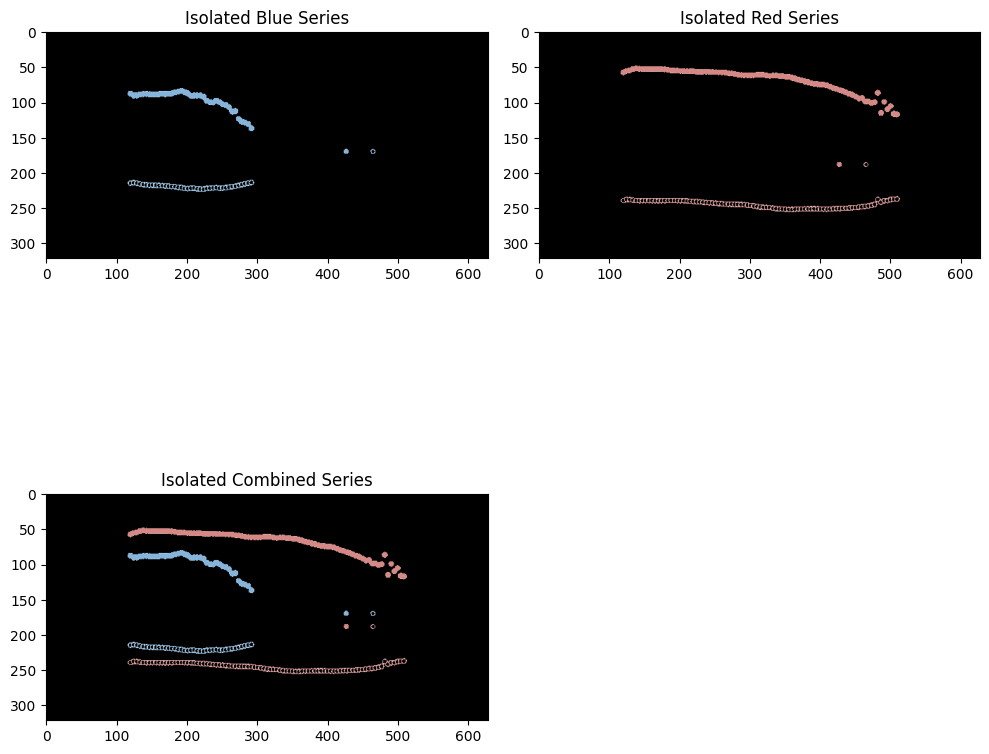

In [5]:
isolated_blue_rgb, isolated_red_rgb, isolated_combined_rgb = get_color_masks(image)

# Plot the images
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(isolated_blue_rgb)
plt.title('Isolated Blue Series')

plt.subplot(2, 2, 2)
plt.imshow(isolated_red_rgb)
plt.title('Isolated Red Series')

plt.subplot(2, 2, 3)
plt.imshow(isolated_combined_rgb)
plt.title('Isolated Combined Series')

plt.tight_layout()
plt.show()

In [6]:
def get_gray_series(isolated_combined_rgb):
    # Convert the isolated gray series to grayscale
    gray_series_gray = cv2.cvtColor(isolated_combined_rgb, cv2.COLOR_BGR2GRAY)

    # Apply a binary threshold to get a binary image
    _, binary_series = cv2.threshold(gray_series_gray, 1, 255, cv2.THRESH_BINARY)

    # Perform morphological closing to connect close components (fill gaps)
    kernel = np.ones((5,5),np.uint8)
    closing = cv2.morphologyEx(binary_series, cv2.MORPH_CLOSE, kernel)

    # Find contours on the closed image
    contours, hierarchy = cv2.findContours(closing, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Assuming the top series has larger areas, sort contours by area and take the largest two
    sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)[:6]
    return binary_series, sorted_contours

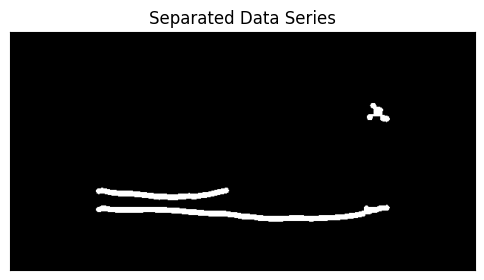

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

binary_series, sorted_contours = get_gray_series(isolated_combined_rgb)

# Create an empty mask to draw the separated contours
separated_mask = np.zeros_like(binary_series)

# Define a list of colors, each color is in BGR format
colors = [
    (255, 0, 0),   # Blue
    (0, 255, 0),   # Green
    (0, 0, 255),   # Red
    (255, 255, 0), # Cyan
    (255, 0, 255), # Magenta
    (0, 255, 255), # Yellow
    # ... add more colors as needed, or generate them randomly
]

# Draw the contours on the mask
for index, sorted_c in enumerate(sorted_contours):
    # Cycle through the list of colors
    color = colors[index % len(colors)]
    cv2.drawContours(separated_mask, [sorted_c], -1, color, -1)  # Draw contour with unique color

# Convert from BGR to RGB for displaying with matplotlib
separated_mask_rgb = cv2.cvtColor(separated_mask, cv2.COLOR_BGR2RGB)

# Show the separated contours
plt.figure(figsize=(6, 6))
plt.imshow(separated_mask_rgb)
plt.title('Separated Data Series')
plt.xticks([]), plt.yticks([])  # Hide tick marks
plt.show()


In [8]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn import datasets
import json
import numpy as np
import cv2
import boto3
from utils import *
from PIL import Image
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from roboflow import Roboflow
from segment_anything import SamPredictor, sam_model_registry
from helper_code.full_extraction_pipeline import get_reconstructed_plot, is_valid_color

In [9]:
rf = Roboflow(ROBOFLOW_API_KEY)
project = rf.workspace().project("legend_classified")
model = project.version(5).model

loading Roboflow workspace...
loading Roboflow project...


In [10]:
sam = sam_model_registry["default"](checkpoint="../../../Downloads/sam_vit_h_4b8939.pth")
predictor = SamPredictor(sam)

In [11]:
import colorsys
# Function to adjust the lightness of a color
def adjust_lightness(color, factor):
    # Convert named color to RGB
    r, g, b = to_rgb(color)
    # Convert RGB to HLS
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    # Adjust lightness
    l = max(min(l * factor, 1), 0)
    # Convert back to RGB
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return r, g, b

In [12]:
def plot_clusters(data, clusters, entire_color, ax, series_label):
    print(entire_color)
    # Convert the named color to an RGB tuple
    base_color = entire_color
    
    # Unique cluster labels
    unique_labels = set(clusters)
    
    new_colors = [adjust_lightness(entire_color, 1 - 0.2 * i) for i in range(len(unique_labels))]

    # Plot each cluster
    for k, col in zip(unique_labels, new_colors):
        # Filter data points that belong to the current cluster
        class_member_mask = (clusters == k)

        print(col)
        
        # Plot data points that are in the cluster
        ax.scatter(data[class_member_mask, 0], data[class_member_mask, 1], color=col, s=1, label=series_label+" Cluster #" +str(k))
        ax.legend()

        # # Plot the outliers
        # if k == -1:
        #     xy = data[class_member_mask]
        #     ax.plot(xy[:, 0], xy[:, 1], markerfacecolor=col, markersize=1)

In [13]:
second_axis = {
    1: False,
    2: False,
    3: False,
    4: False,
    5: False,
    6: False,
    7: False,
    8: False,
    9: False,
    10: False,
    11: False,
    12: False,
    13: True,
    14: False,
    15: True,
    16: True,
    17: False,
    18: False,
    19: True,
    20: True,
    21: True,
    22: False,
    23: False,
    24: False,
    25: True,
    26: True,
    27: True,
    28: True
}

In [14]:
def second_axis_clustering(rgb_colors, coordinates, series_labels, x_axis_title, y_axis_title):
    new_data = {}
    for index, value in enumerate(coordinates):
        temp = []
        
        for i in range(len(value)):
            temp.append([value[i]["middle"][0], value[i]["middle"][1]])
        
        new_data[rgb_colors[index]] = temp
    
    # Flatten the list as DBSCAN expects a 2D array of shape (n_samples, n_features)
    # Let's consider that each inner list is a point and filter out empty lists
    flattened_data = {
        color: np.array([point for point in points if point]) 
        for color, points in new_data.items()
    }

    # Perform DBSCAN clustering on each set of points
    eps = 3  # Example epsilon value
    min_samples = 2  # Example min_samples value

    clusters = {}

    for color, points in flattened_data.items():
        # Apply DBSCAN if there are enough points to cluster
        if len(points) >= min_samples:
            db = DBSCAN(eps=eps, min_samples=min_samples).fit(points)
            clusters[color] = db.labels_
        else:
            clusters[color] = np.array([])

    # Create a plot
    fig, ax = plt.subplots(figsize=(12, 8))

    # Plot each color series
    for color, label in zip(rgb_colors, series_labels):
        points = flattened_data[color]
        if points.size > 0:
            plot_clusters(points, clusters[color], color, ax, label)

    # Title and labels
    plt.title('DBSCAN Clustering of Multicolored Data Points')
    plt.xlabel(x_axis_title)
    plt.ylabel(y_axis_title)

    # Show the plot
    plt.show()

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [60, 37], 'bottomRight': [405, 314]}


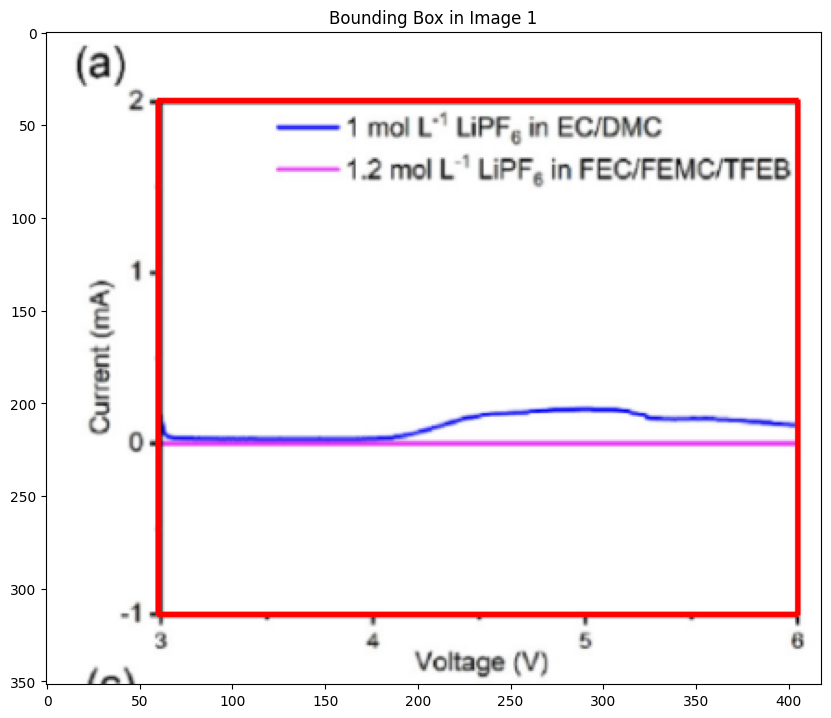

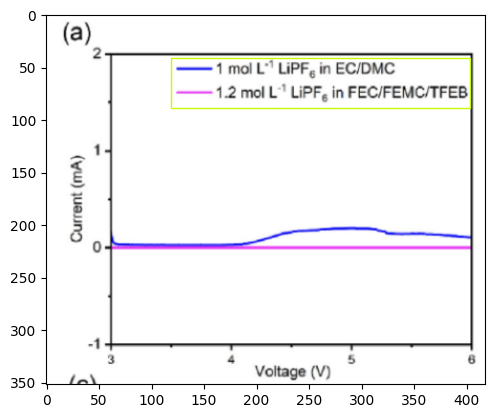

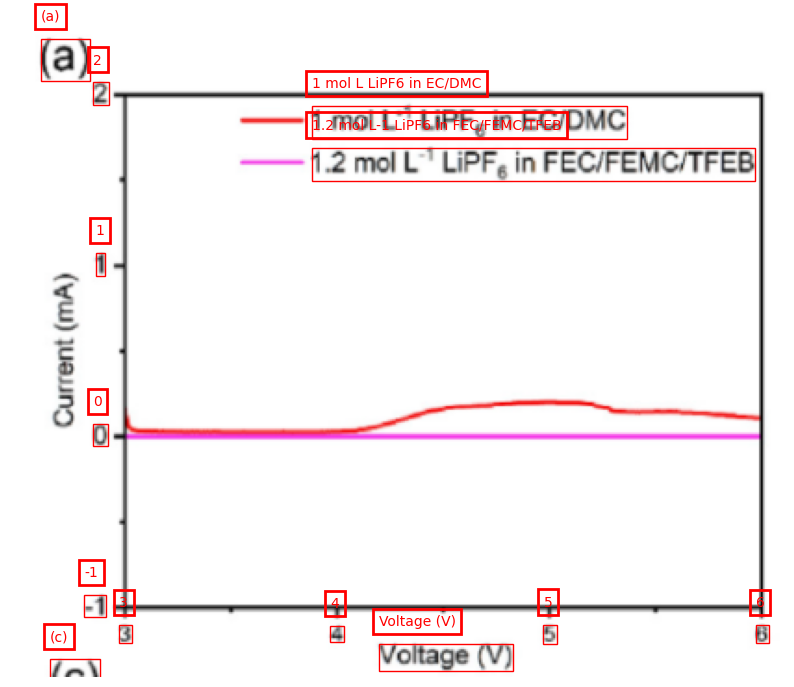

Y MIN -1
Y MAX 2
SEMANTIC Y MIN -1.0
SEMANTIC Y MAX 2.0
Y
OCR DIFF -276.2480685710907
SEM DIFF 3.0
OCR RATIO -92.0826895236969
PIXEL DIFF -0.7853229641914368
REAL DIFF FROM BASE POINT 0.008528453808783885
Y_MIN -1.008528453808784
Y_MAX 1.999637374457079
SEMANTIC X MIN 3.0
SEMANTIC X MAX 6.0
X
OCR DIFF 343.2775085028261
SEM DIFF 3.0
OCR RATIO 0.008739285055651417
PIXEL DIFF 1.878185460343957
REAL DIFF FROM BASE POINT 0.01641399812532572
X_MIN 2.9835860018746745
X_MAX 5.998639346074413
X
Predicted [2.9835860018746745, 5.998639346074413]
Chat GPT [3, 6]
Y
Predicted [-1.008528453808784, 1.999637374457079]
Chat GPT [-1, 2]


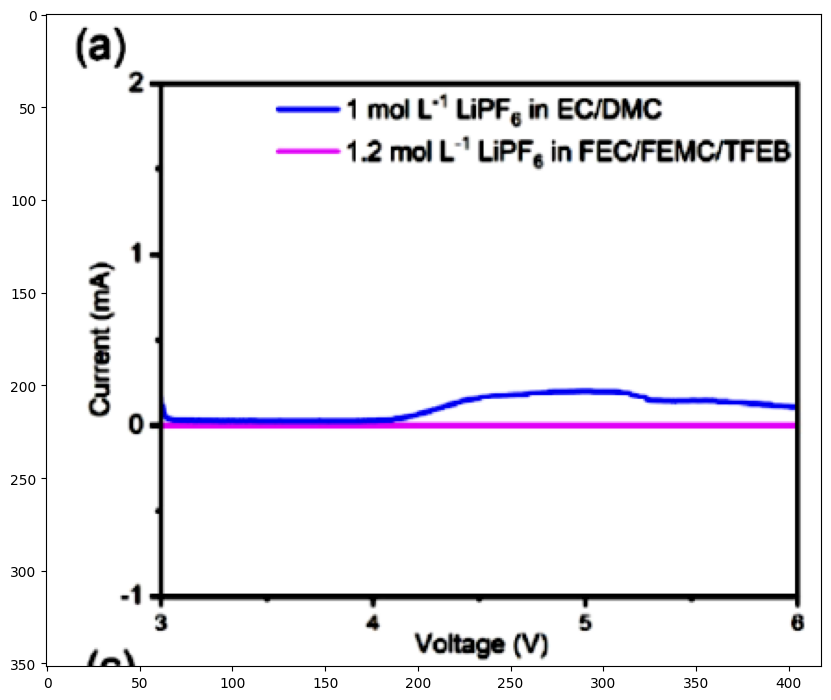

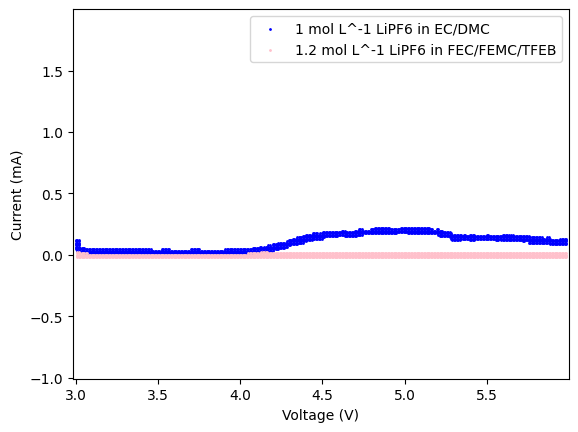

{'topLeft': (71, 9), 'bottomRight': (413, 285)}


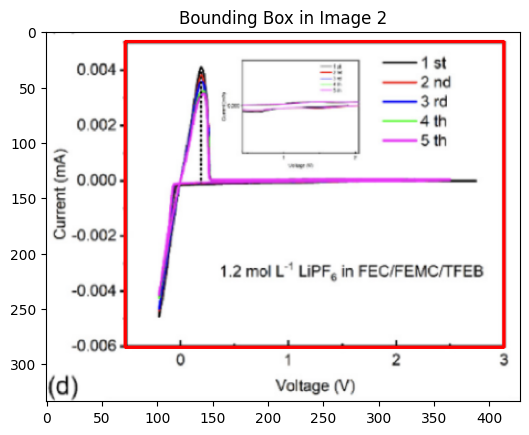

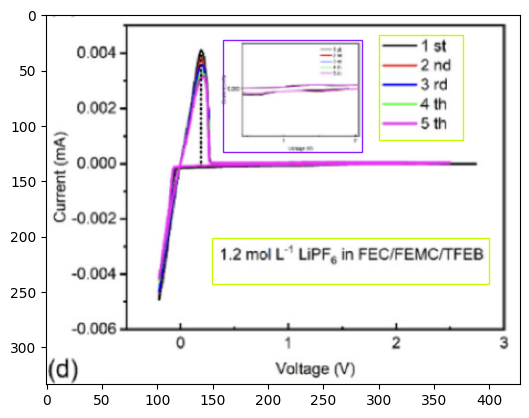

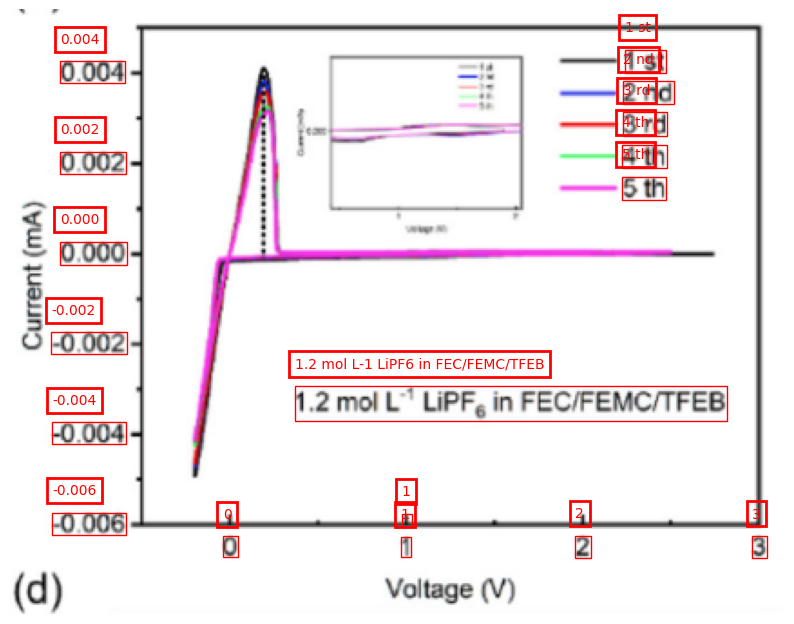

Y MIN -0.006
Y MAX 0.004
SEMANTIC Y MIN -0.006
SEMANTIC Y MAX 0.004
Y
OCR DIFF -249.2851365543902
SEM DIFF 0.01
OCR RATIO -24928.51365543902
PIXEL DIFF -1.3905342780053616
REAL DIFF FROM BASE POINT 5.578087395122205e-05
Y_MIN -0.006055780873951222
Y_MAX 0.005015878022959426
SEMANTIC X MIN 0.0
SEMANTIC X MAX 3.0
X
OCR DIFF 292.2393381483853
SEM DIFF 3.0
OCR RATIO 0.010265558425528402
PIXEL DIFF 50.2435143776238
REAL DIFF FROM BASE POINT 0.5157777323473733
X_MIN -0.5157777323473733
X_MAX 2.99504324918334
X
Predicted [-0.5157777323473733, 2.99504324918334]
Chat GPT [0, 3]
Y
Predicted [-0.006055780873951222, 0.005015878022959426]
Chat GPT [-0.006, 0.004]


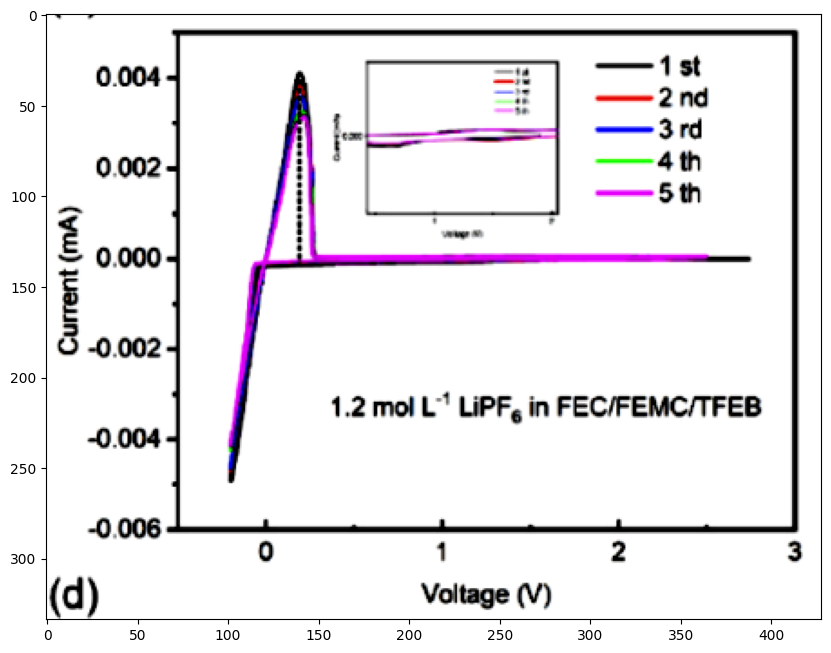

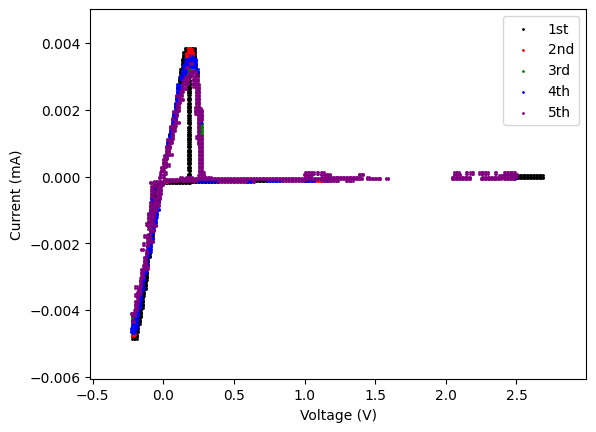

{'topLeft': (77, 5), 'bottomRight': (423, 278)}


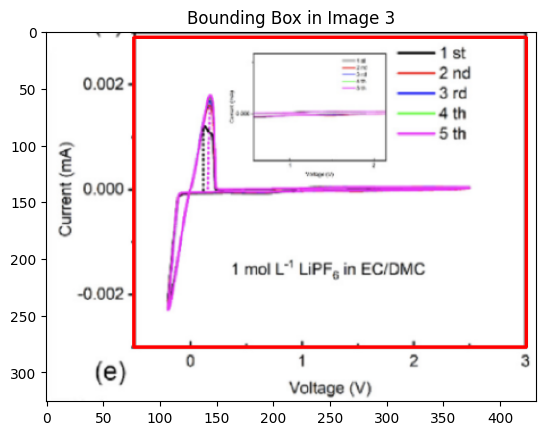

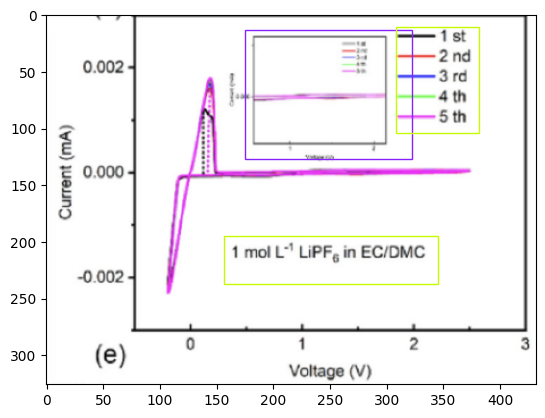

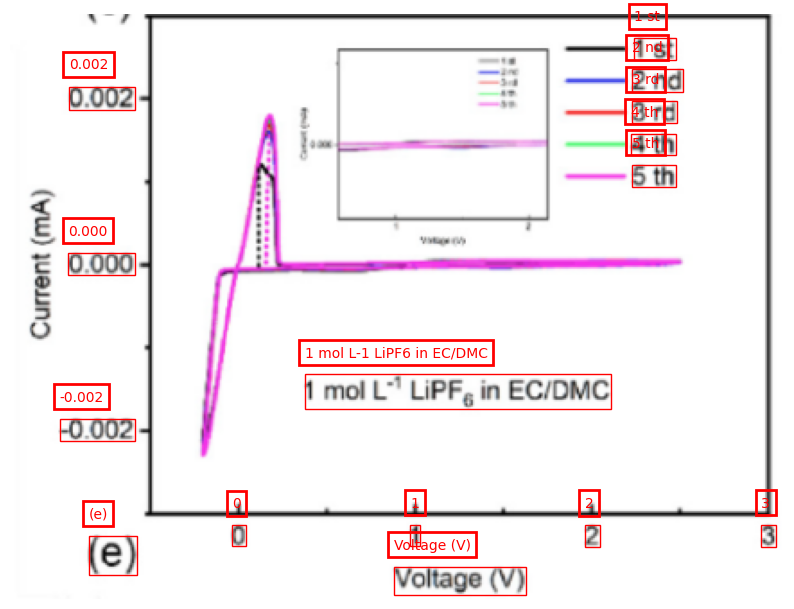

Y MIN -0.002
Y MAX 0.002
SEMANTIC Y MIN -0.002
SEMANTIC Y MAX 0.002
Y
OCR DIFF -184.85223952680826
SEM DIFF 0.004
OCR RATIO -46213.059881702065
PIXEL DIFF -46.83104136586189
REAL DIFF FROM BASE POINT 0.0010133724424598103
Y_MIN -0.0030133724424598104
Y_MAX 0.0028940485484643076
SEMANTIC X MIN 0.0
SEMANTIC X MAX 3.0
X
OCR DIFF 295.2671355307102
SEM DIFF 3.0
OCR RATIO 0.010160290933184385
PIXEL DIFF 50.17199619114399
REAL DIFF FROM BASE POINT 0.5097620780006418
X_MIN -0.5097620780006418
X_MAX 3.0056985848811553
X
Predicted [-0.5097620780006418, 3.0056985848811553]
Chat GPT [0, 3]
Y
Predicted [-0.0030133724424598104, 0.0028940485484643076]
Chat GPT [-0.002, 0.002]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


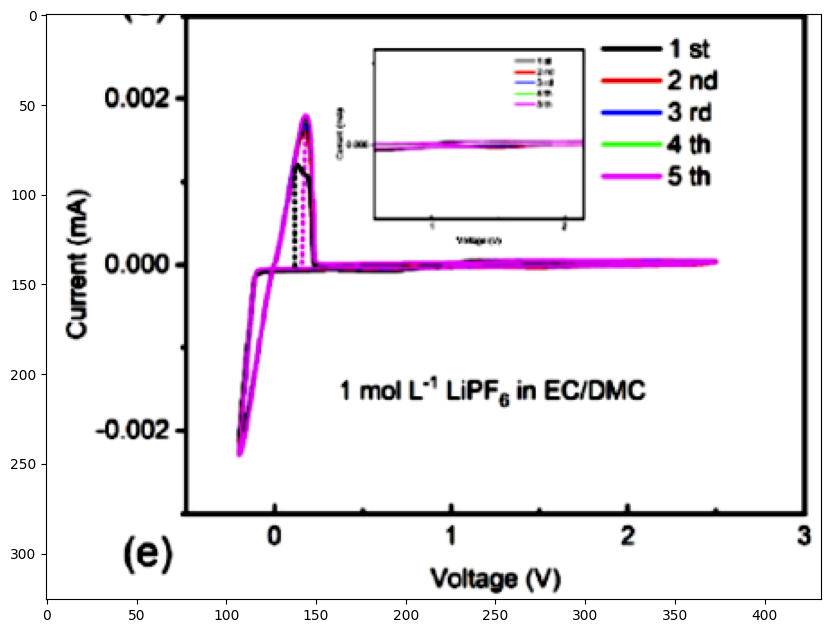

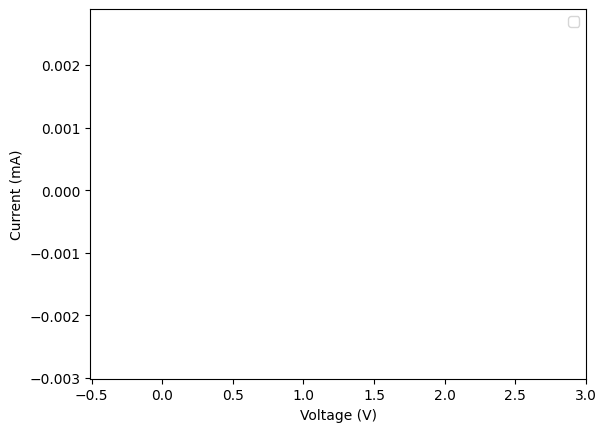

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [65, 10], 'bottomRight': [418, 272]}


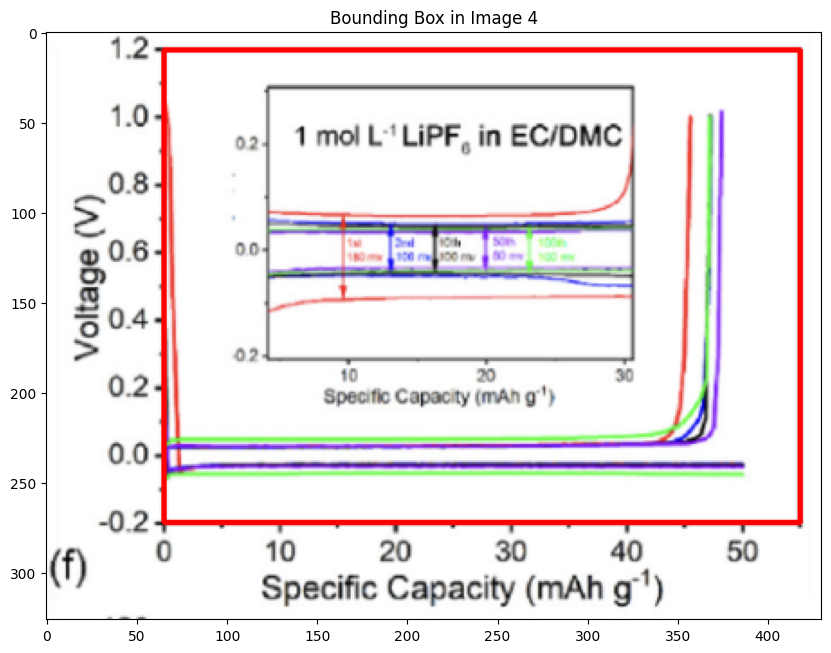

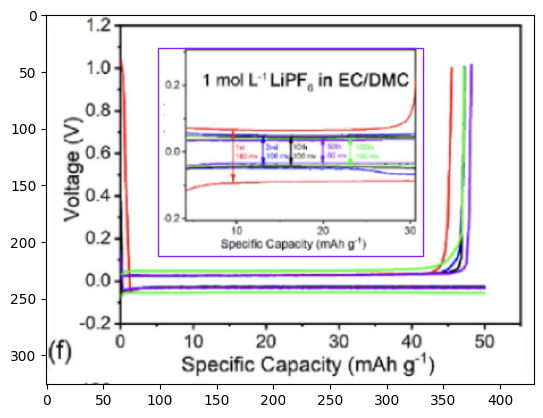

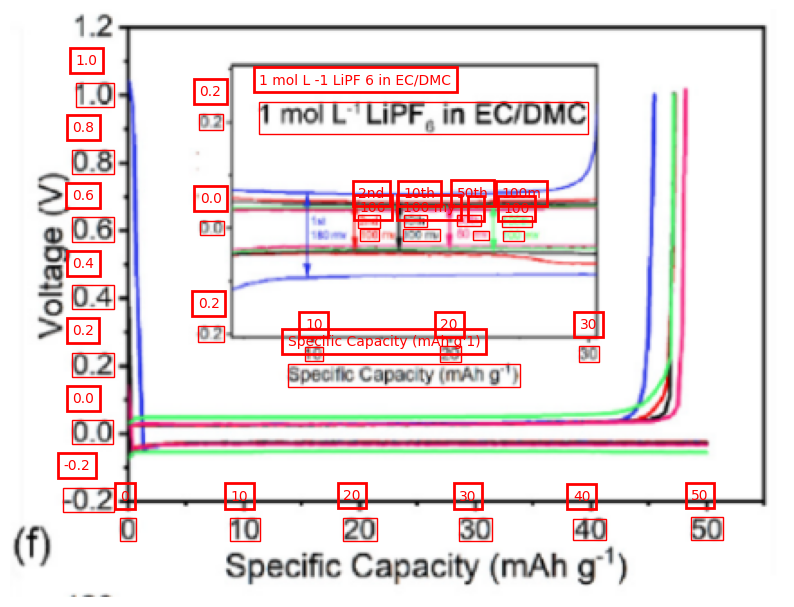

Y MIN -0.2
Y MAX 1.0
SEMANTIC Y MIN -0.2
SEMANTIC Y MAX 1.0
Y
OCR DIFF -224.86636744439602
SEM DIFF 1.2
OCR RATIO -187.3886395369967
PIXEL DIFF -0.4206371270120144
REAL DIFF FROM BASE POINT 0.002244731207032253
Y_MIN -0.20224473120703226
Y_MAX 1.1959190029838687
SEMANTIC X MIN 0.0
SEMANTIC X MAX 50.0
X
OCR DIFF 321.0484002530575
SEM DIFF 50.0
OCR RATIO 0.1557397574963429
PIXEL DIFF 0.2149977907538414
REAL DIFF FROM BASE POINT 0.03348370379425273
X_MIN -0.03348370379425273
X_MAX 54.94265069241479
X
Predicted [-0.03348370379425273, 54.94265069241479]
Chat GPT [0, 50]
Y
Predicted [-0.20224473120703226, 1.1959190029838687]
Chat GPT [-0.2, 1.2]


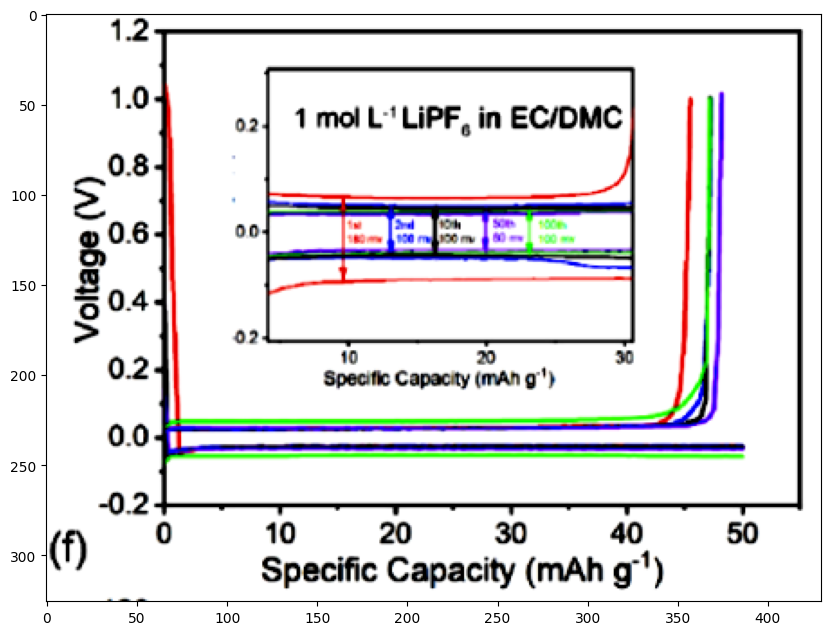

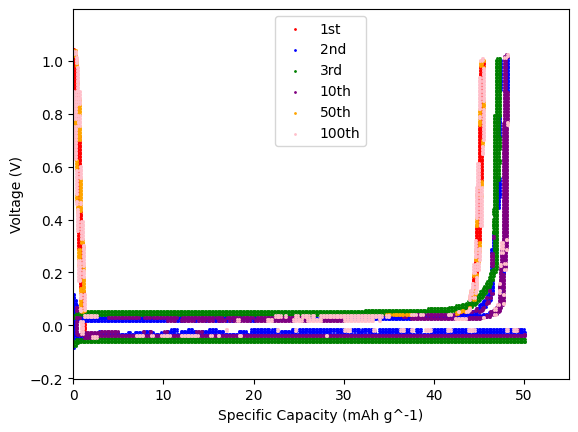

{'topLeft': (63, 10), 'bottomRight': (410, 257)}


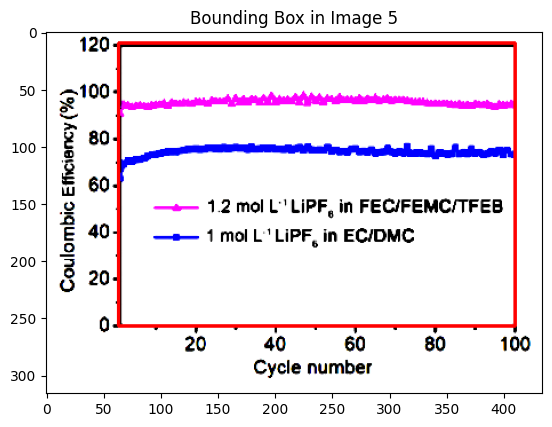

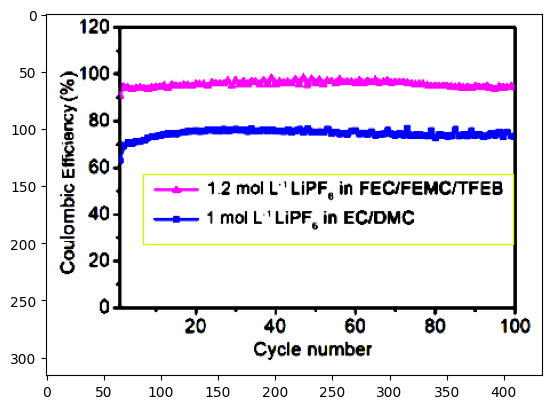

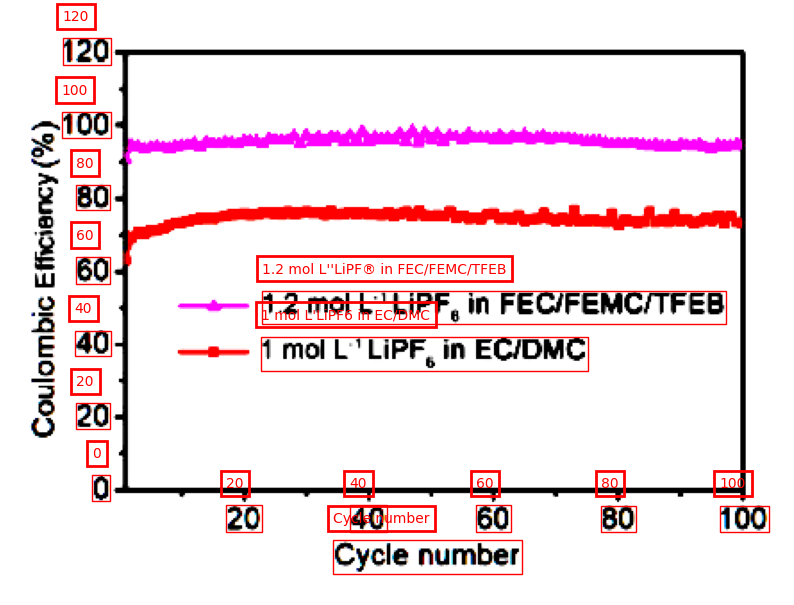

Y MIN 0
Y MAX 120
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 120.0
Y
OCR DIFF -244.5331815816462
SEM DIFF 120.0
OCR RATIO -2.037776513180385
PIXEL DIFF -1.3257007375359535
REAL DIFF FROM BASE POINT 0.6505623796139032
Y_MIN -0.6505623796139032
Y_MAX 120.55998176121723
SEMANTIC X MIN 20.0
SEMANTIC X MAX 100.0
X
OCR DIFF 280.0817366577685
SEM DIFF 80.0
OCR RATIO 0.28563090530159024
PIXEL DIFF 67.605942863971
REAL DIFF FROM BASE POINT 19.31034666400362
X_MIN 0.689653335996379
X_MAX 99.8035774756482
X
Predicted [0.689653335996379, 99.8035774756482]
Chat GPT [0, 100]
Y
Predicted [-0.6505623796139032, 120.55998176121723]
Chat GPT [20, 120]


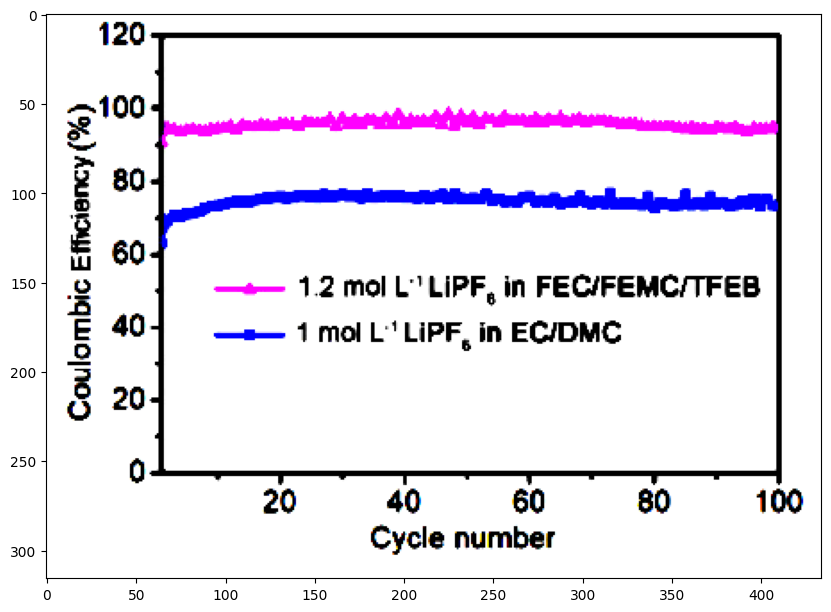

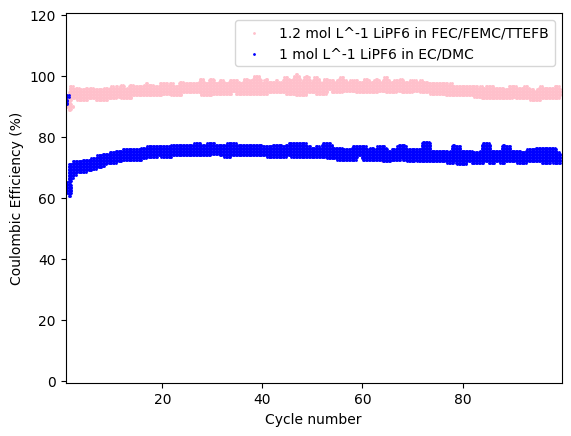

{'topLeft': (73, 12), 'bottomRight': (411, 263)}


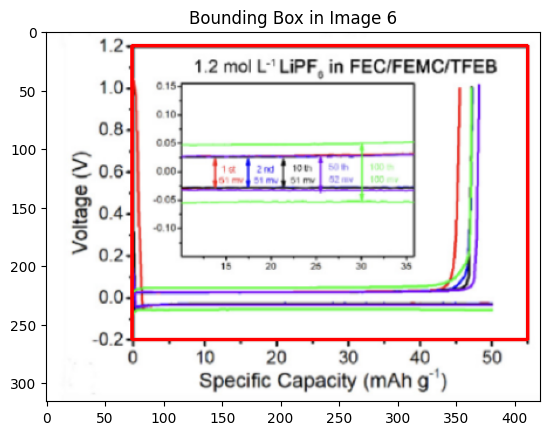

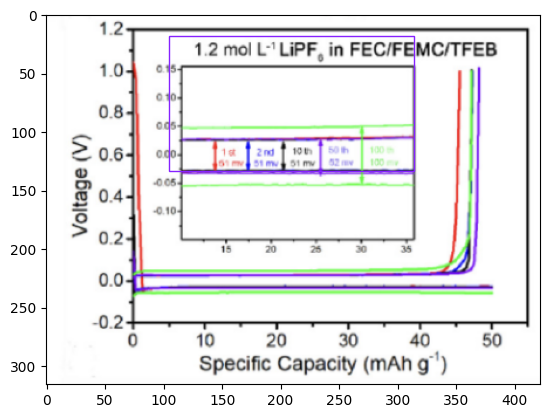

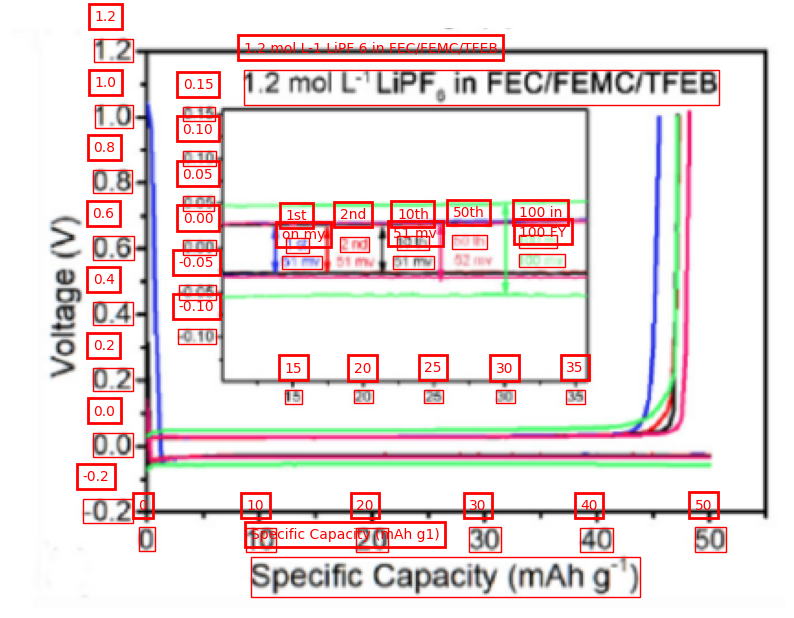

Y MIN -0.2
Y MAX 1.2
SEMANTIC Y MIN -0.2
SEMANTIC Y MAX 1.2
Y
OCR DIFF -250.68915536999702
SEM DIFF 1.4
OCR RATIO -179.06368240714073
PIXEL DIFF -0.34766835719347
REAL DIFF FROM BASE POINT 0.0019415905700127924
Y_MIN -0.2019415905700128
Y_MAX 1.1997943540158704
SEMANTIC X MIN 0.0
SEMANTIC X MAX 50.0
X
OCR DIFF 306.90811279416084
SEM DIFF 50.0
OCR RATIO 0.1629152111516007
PIXEL DIFF 0.9941153451800346
REAL DIFF FROM BASE POINT 0.16195651136905176
X_MIN -0.16195651136905176
X_MAX 54.90338485787199
X
Predicted [-0.16195651136905176, 54.90338485787199]
Chat GPT [0, 50]
Y
Predicted [-0.2019415905700128, 1.1997943540158704]
Chat GPT [-0.2, 1.2]


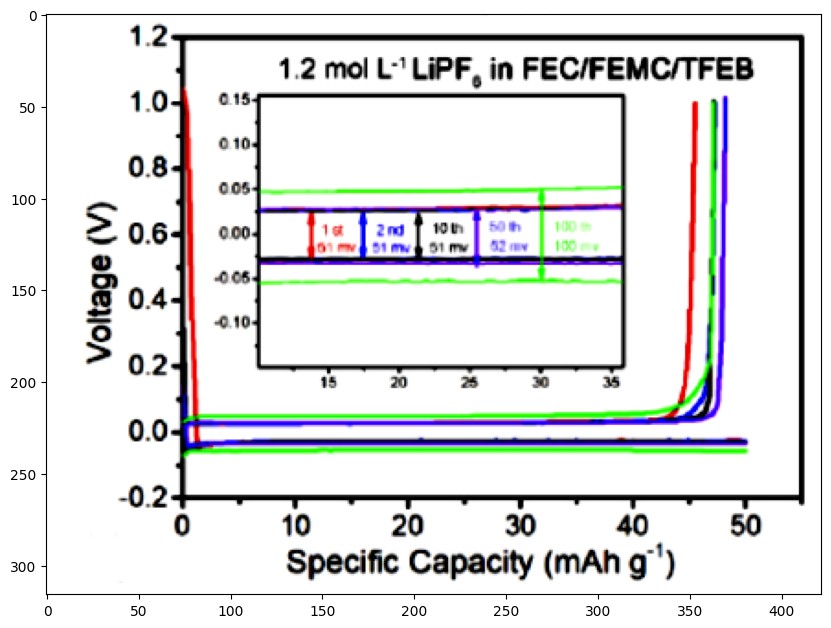

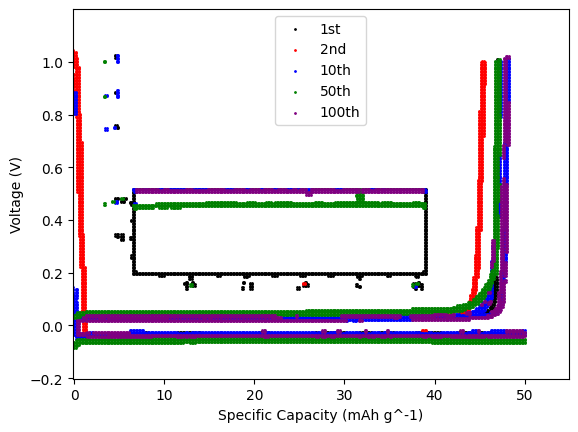

{'topLeft': (124, 31), 'bottomRight': (1074, 478)}


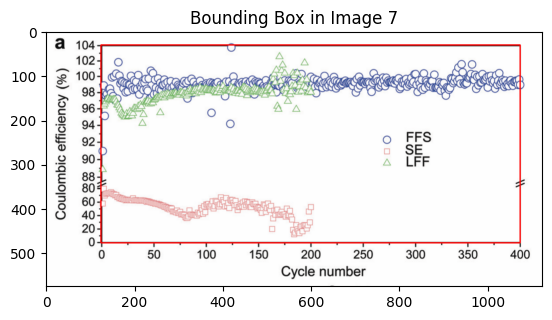

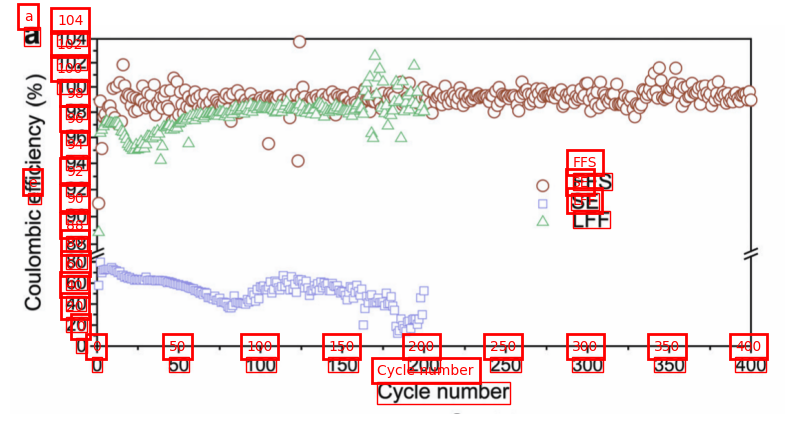

Y MIN 0
Y MAX 104
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 104.0
Y
OCR DIFF -444.8226435184479
SEM DIFF 104.0
OCR RATIO -4.277140803061998
PIXEL DIFF -2.1606143712997437
REAL DIFF FROM BASE POINT 0.505153903222677
Y_MIN -0.505153903222677
Y_MAX 104.00391432291414
SEMANTIC X MIN 0.0
SEMANTIC X MAX 400.0
X
OCR DIFF 948.1240668557584
SEM DIFF 400.0
OCR RATIO 0.42188571515383066
PIXEL DIFF 1.7774370349943638
REAL DIFF FROM BASE POINT 0.7498752946495015
X_MIN -0.7498752946495015
X_MAX 400.0415541014896
X
Predicted [-0.7498752946495015, 400.0415541014896]
Chat GPT [0, 400]
Y
Predicted [-0.505153903222677, 104.00391432291414]
Chat GPT [0, 104]


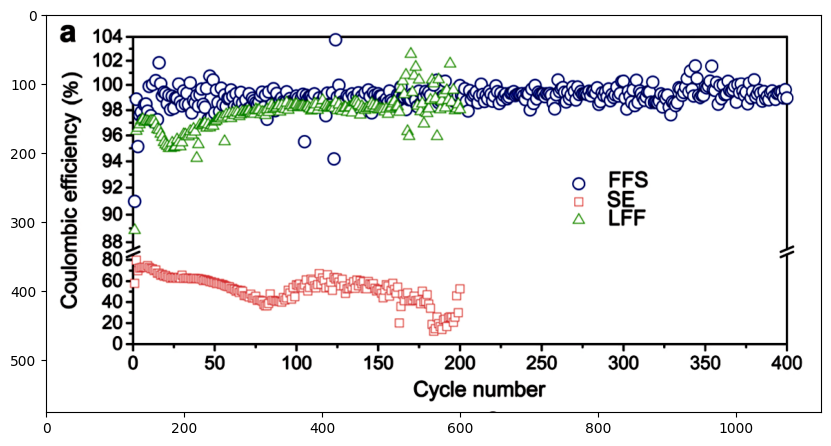

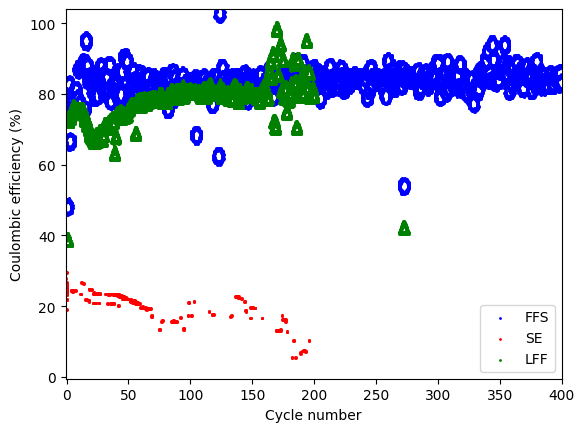

{'topLeft': (115, 40), 'bottomRight': (665, 398)}


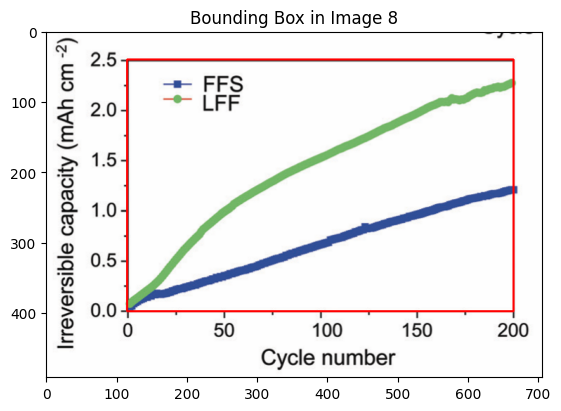

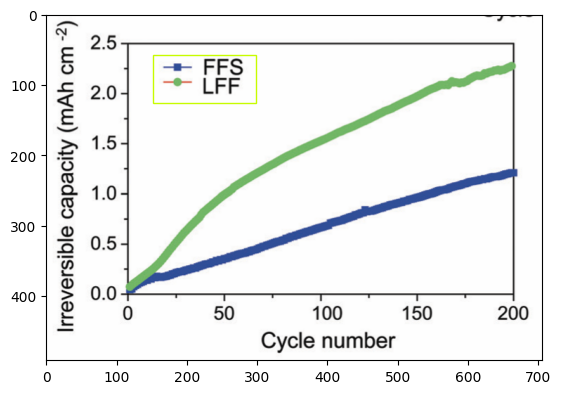

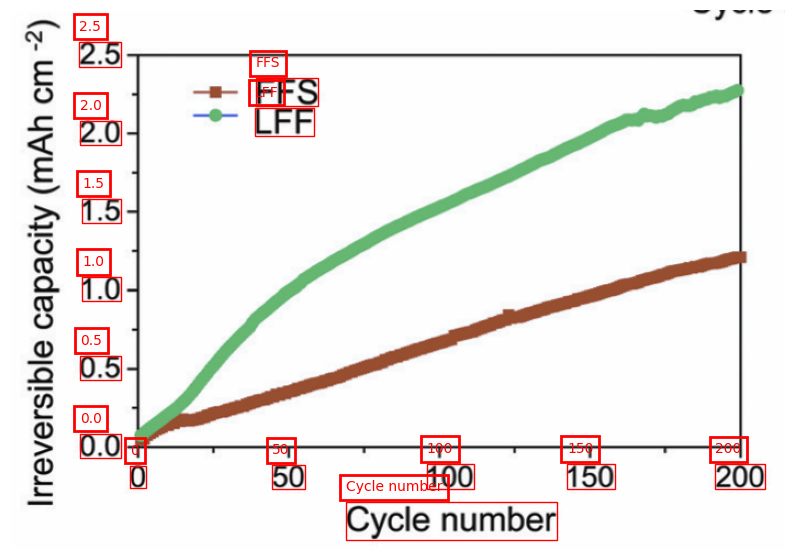

Y MIN 0.0
Y MAX 2.5
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 2.5
Y
OCR DIFF -356.9036231562495
SEM DIFF 2.5
OCR RATIO -142.7614492624998
PIXEL DIFF -1.3285436183214188
REAL DIFF FROM BASE POINT 0.009306039026534294
Y_MIN -0.009306039026534294
Y_MAX 2.4983737432215047
SEMANTIC X MIN 0.0
SEMANTIC X MAX 200.0
X
OCR DIFF 548.3856881856918
SEM DIFF 200.0
OCR RATIO 0.3647068191398112
PIXEL DIFF 1.2605218142271042
REAL DIFF FROM BASE POINT 0.45972090132311116
X_MIN -0.45972090132311116
X_MAX 200.12902962557303
X
Predicted [-0.45972090132311116, 200.12902962557303]
Chat GPT [0, 200]
Y
Predicted [-0.009306039026534294, 2.4983737432215047]
Chat GPT [0, 2.5]


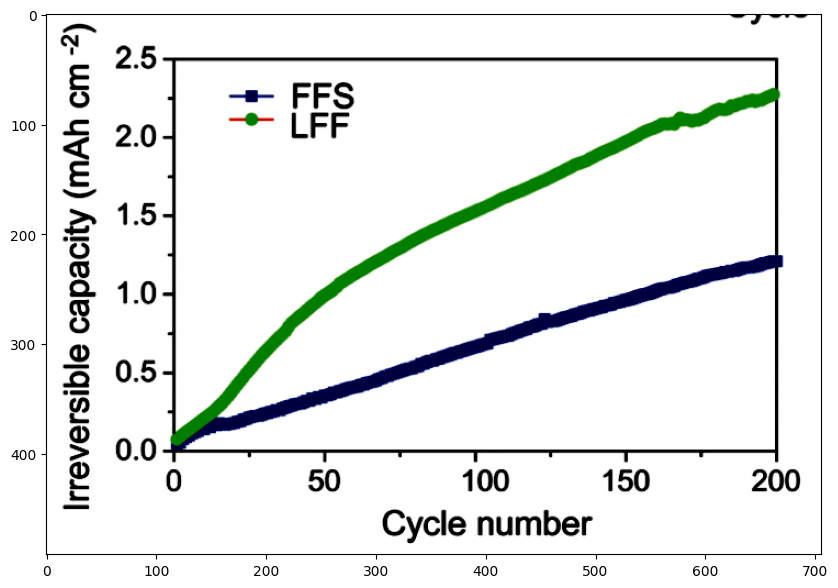

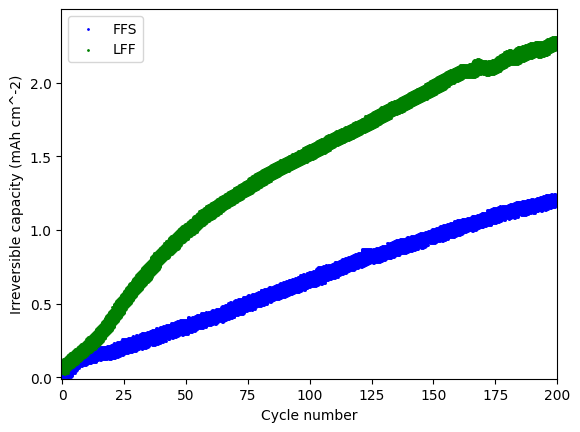

[[[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [117, 22], 'bottomRight': [636, 427]}


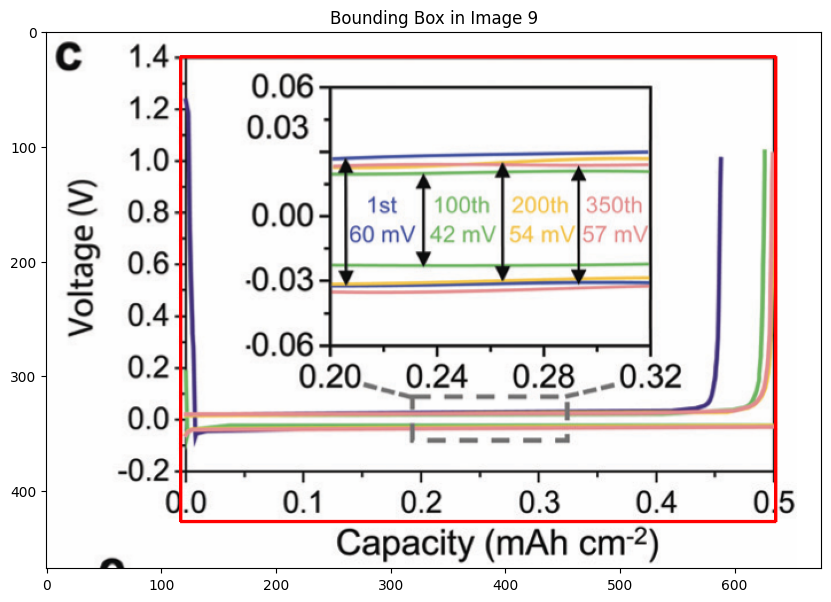

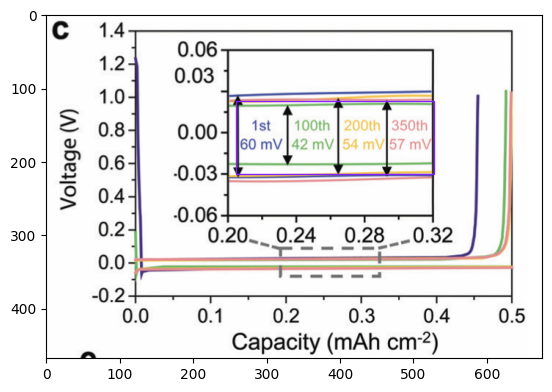

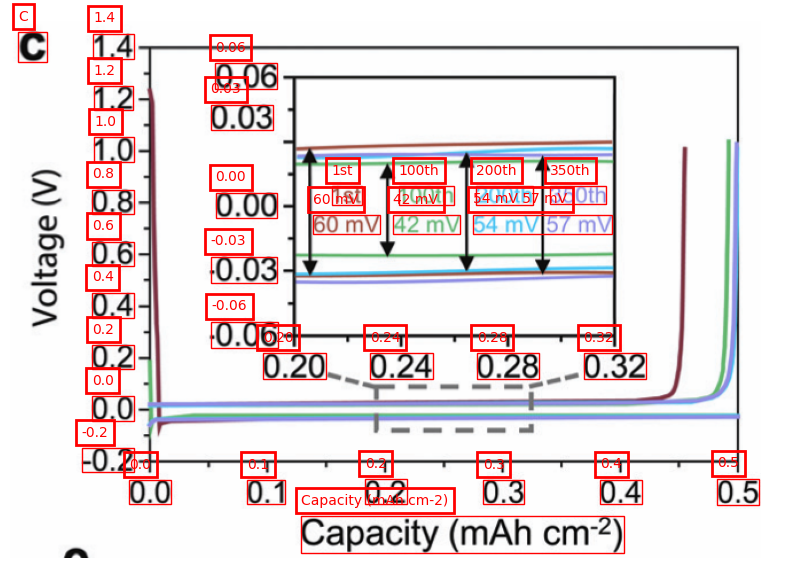

Y MIN -0.2
Y MAX 1.4
SEMANTIC Y MIN -0.2
SEMANTIC Y MAX 1.4
Y
OCR DIFF -361.0812679231167
SEM DIFF 1.5999999999999999
OCR RATIO -225.67579245194796
PIXEL DIFF -44.759394623339176
REAL DIFF FROM BASE POINT 0.19833493941477828
Y_MIN -0.39833493941477827
Y_MAX 1.3962749104043364
x is in fault condition
X
Predicted [0, 0.5]
Chat GPT [0, 0.5]
Y
Predicted [-0.39833493941477827, 1.3962749104043364]
Chat GPT [-0.2, 1.4]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


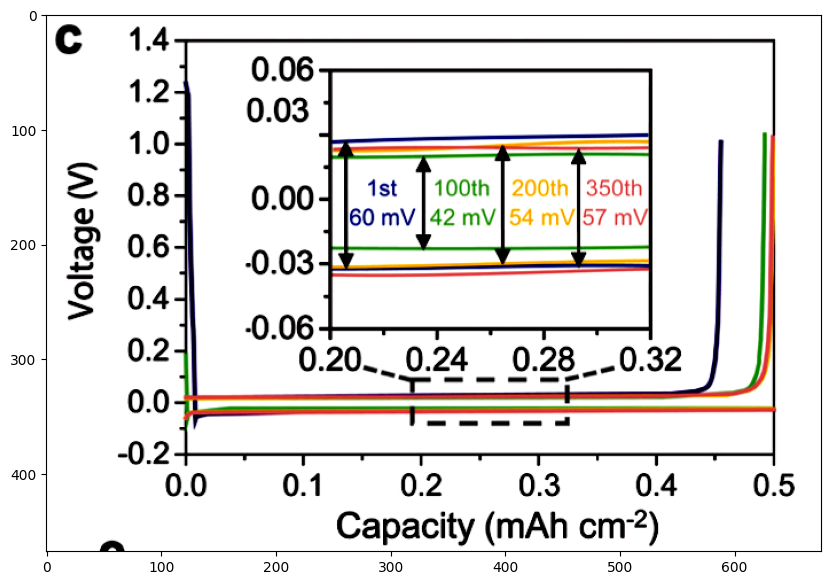

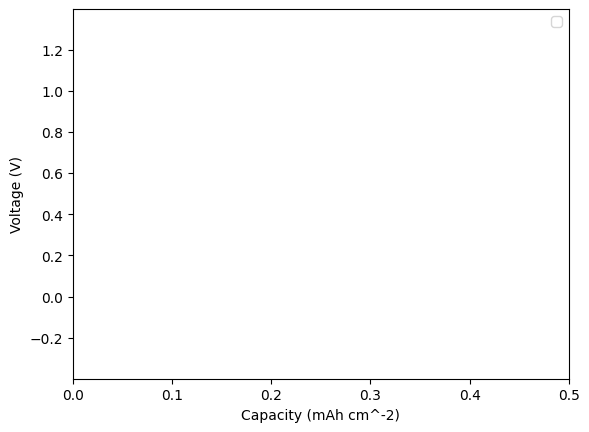

{'topLeft': (171, 26), 'bottomRight': (713, 427)}


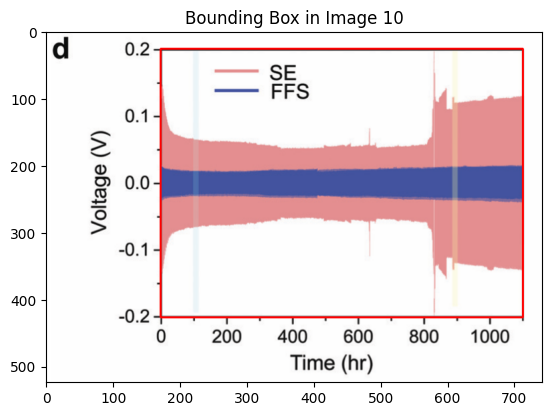

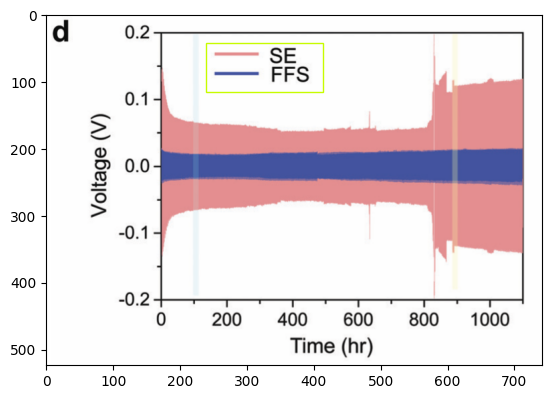

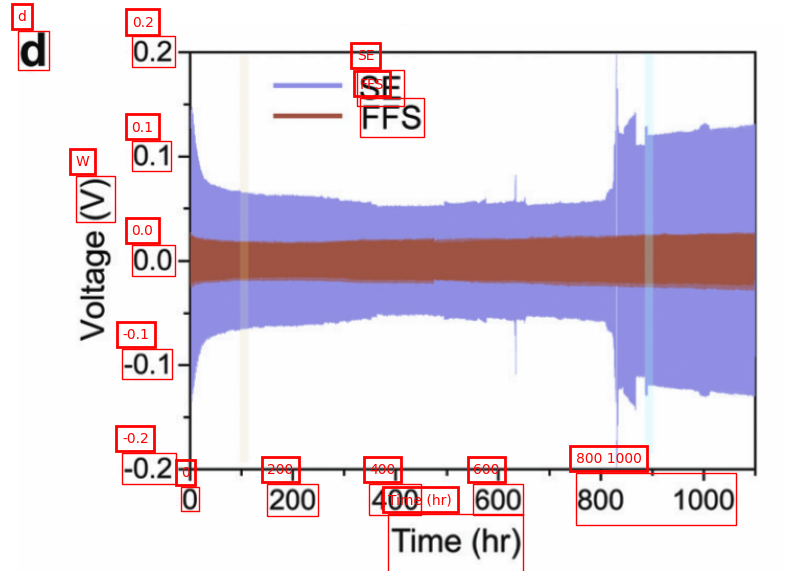

Y MIN -0.2
Y MAX 0.2
SEMANTIC Y MIN -0.2
SEMANTIC Y MAX 0.2
Y
OCR DIFF -398.8215855062008
SEM DIFF 0.4
OCR RATIO -997.053963765502
PIXEL DIFF -1.7405380085110664
REAL DIFF FROM BASE POINT 0.0017456808475417938
Y_MIN -0.2017456808475418
Y_MAX 0.2004391702968959
SEMANTIC X MIN 0.0
SEMANTIC X MAX 600.0
X
OCR DIFF 294.7961482834071
SEM DIFF 600.0
OCR RATIO 2.0353047470049717
PIXEL DIFF 1.0109993014484644
REAL DIFF FROM BASE POINT 2.05769167745677
X_MIN -2.05769167745677
X_MAX 1101.077481199238
X
Predicted [-2.05769167745677, 1101.077481199238]
Chat GPT [0, 1000]
Y
Predicted [-0.2017456808475418, 0.2004391702968959]
Chat GPT [-0.2, 0.2]


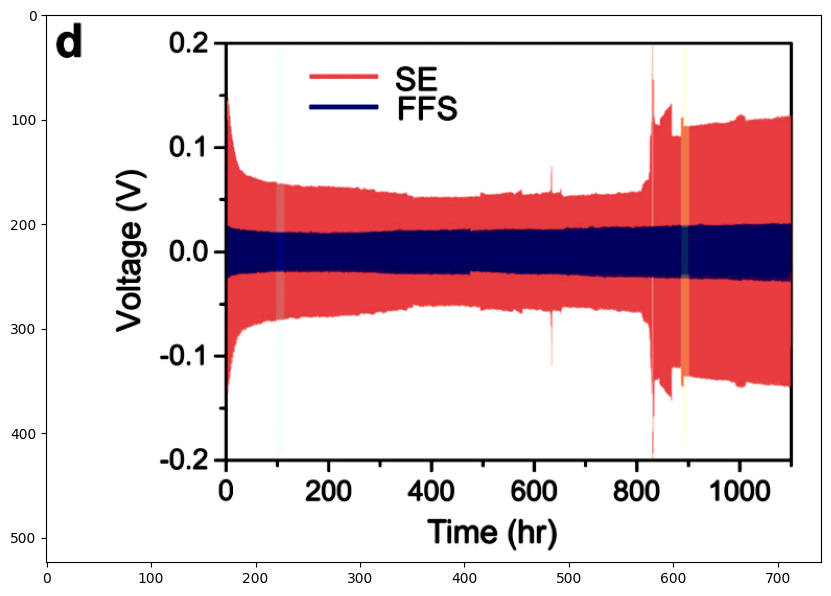

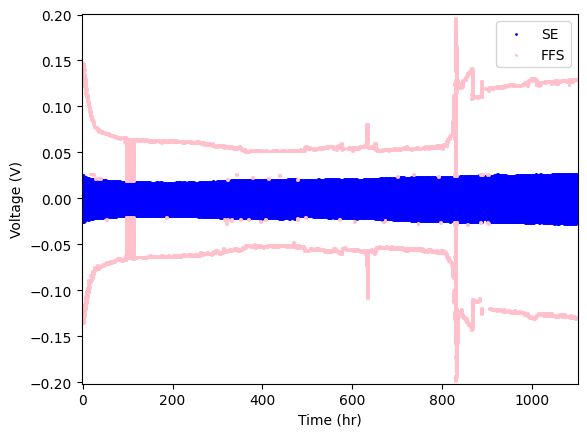

[[[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 ...

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]]
{'topLeft': [174, 24], 'bottomRight': [537, 215]}


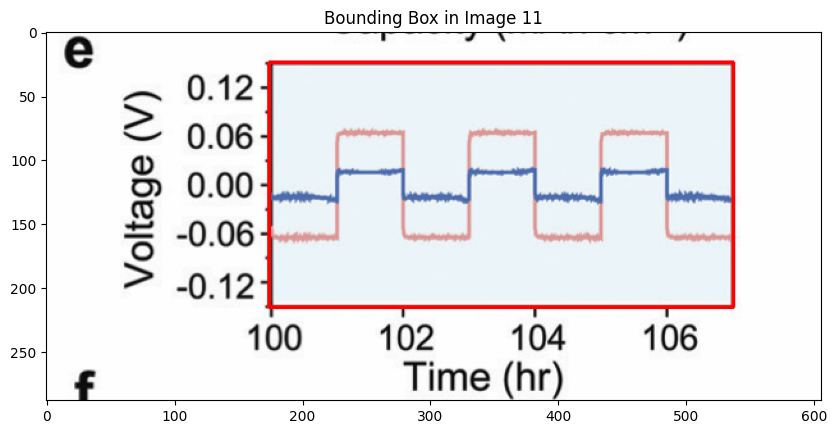

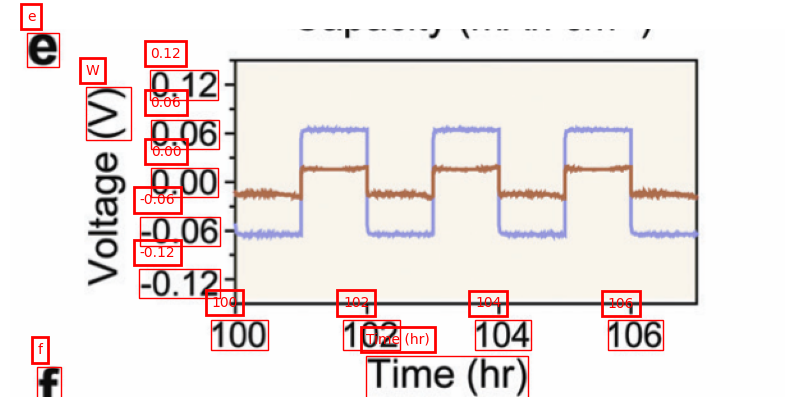

Y MIN -0.12
Y MAX 0.12
SEMANTIC Y MIN -0.12
SEMANTIC Y MAX 0.12
Y
OCR DIFF -155.11934101581573
SEM DIFF 0.24
OCR RATIO -646.3305875658989
PIXEL DIFF -16.122446656227112
REAL DIFF FROM BASE POINT 0.024944582488266177
Y_MIN -0.14494458248826617
Y_MAX 0.15056982403133232
SEMANTIC X MIN 100.0
SEMANTIC X MAX 106.0
X
OCR DIFF 309.5858713388443
SEM DIFF 6.0
OCR RATIO 0.0193807294049054
PIXEL DIFF 4.880552127957344
REAL DIFF FROM BASE POINT 0.09458866013847653
X_MIN 99.90541133986153
X_MAX 106.9406161138422
X
Predicted [99.90541133986153, 106.9406161138422]
Chat GPT [100, 106]
Y
Predicted [-0.14494458248826617, 0.15056982403133232]
Chat GPT [-0.12, 0.12]


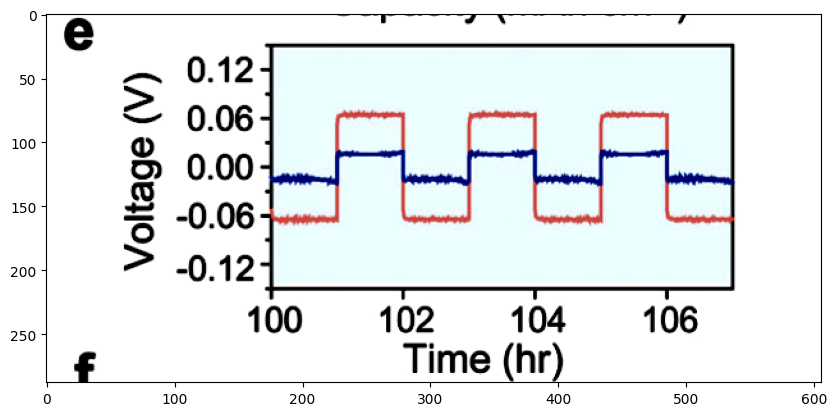

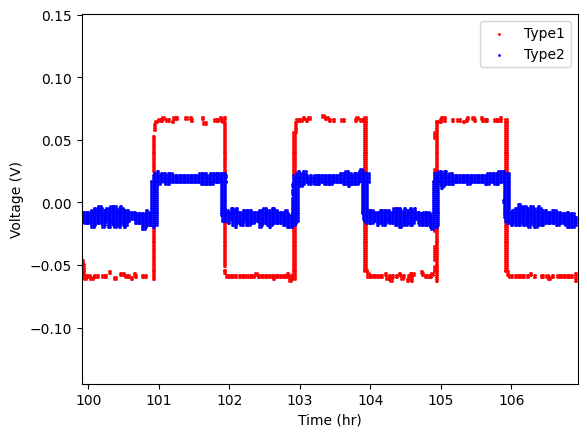

[[[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [124, 4], 'bottomRight': [485, 194]}


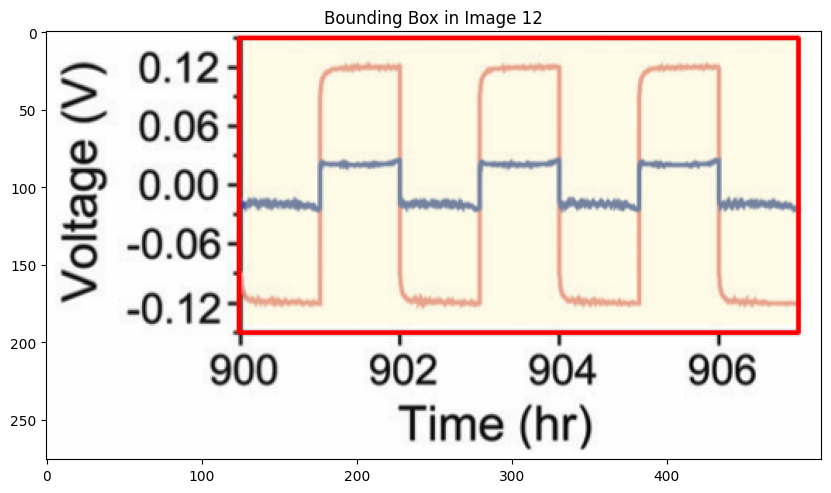

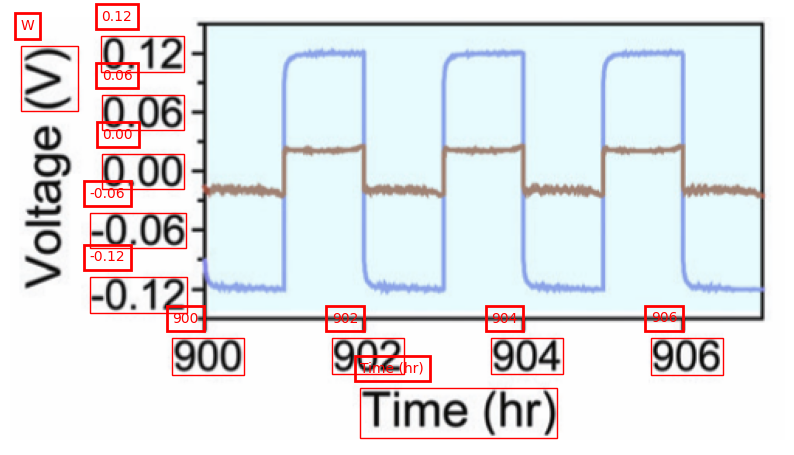

Y MIN -0.12
Y MAX 0.12
SEMANTIC Y MIN -0.12
SEMANTIC Y MAX 0.12
Y
OCR DIFF -155.2628748714924
SEM DIFF 0.24
OCR RATIO -646.9286452978849
PIXEL DIFF -15.533799767494202
REAL DIFF FROM BASE POINT 0.02401161222400579
Y_MIN -0.1440116122240058
Y_MAX 0.14968383839638302
SEMANTIC X MIN 900.0
SEMANTIC X MAX 906.0
X
OCR DIFF 308.84749442338943
SEM DIFF 6.0
OCR RATIO 0.019427063869181943
PIXEL DIFF 3.327714115381241
REAL DIFF FROM BASE POINT 0.06464771465788965
X_MIN 899.9353522853421
X_MAX 906.9485223421168
X
Predicted [899.9353522853421, 906.9485223421168]
Chat GPT [900, 906]
Y
Predicted [-0.1440116122240058, 0.14968383839638302]
Chat GPT [-0.12, 0.12]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


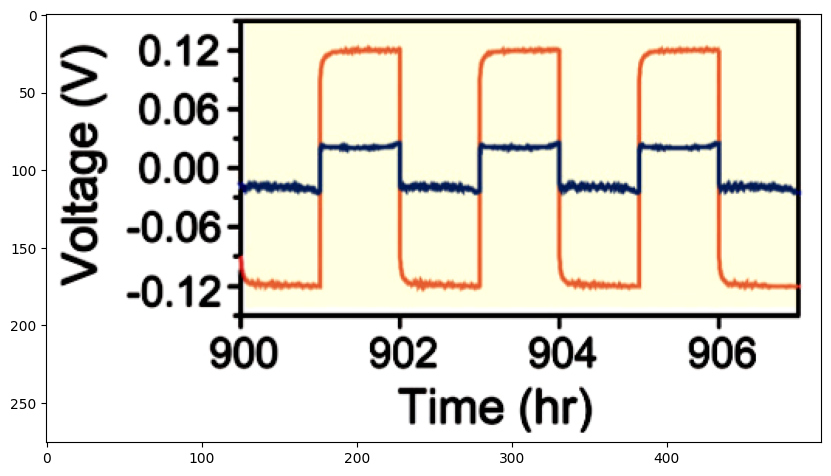

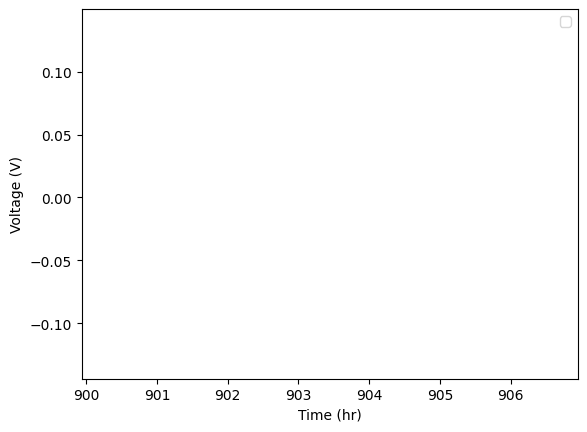

{'topLeft': (76, 14), 'bottomRight': (574, 264)}


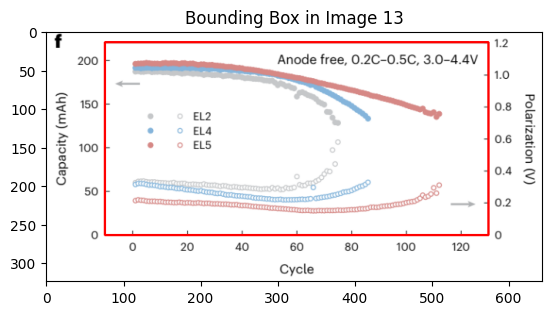

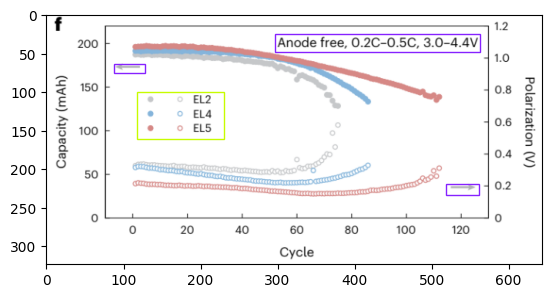

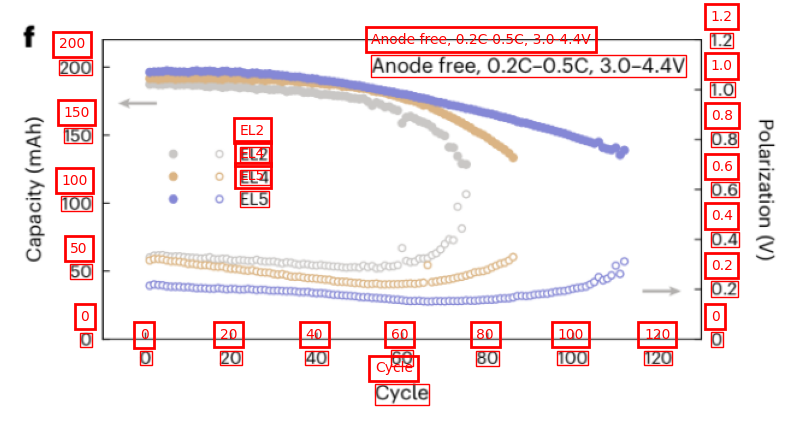

Y MIN 0
Y MAX 200
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 200.0
Y
OCR DIFF -226.1286244019866
SEM DIFF 200.0
OCR RATIO -1.1306431220099329
PIXEL DIFF 0.3697983920574188
REAL DIFF FROM BASE POINT -0.3270690679124567
Y_MIN 0.3270690679124567
Y_MAX 221.44016402538895
SEMANTIC X MIN 0.0
SEMANTIC X MAX 0.0
X
OCR DIFF 523.985451200977
SEM DIFF 0.0
OCR RATIO 0.0
PIXEL DIFF -13.008792079985142
REAL DIFF FROM BASE POINT -0.0
X_MIN 0.0
X_MAX 0.0
X
Predicted [0.0, 0.0]
Chat GPT [0, 120]
Y
Predicted [0.3270690679124567, 221.44016402538895]
Chat GPT [0, 200]


Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


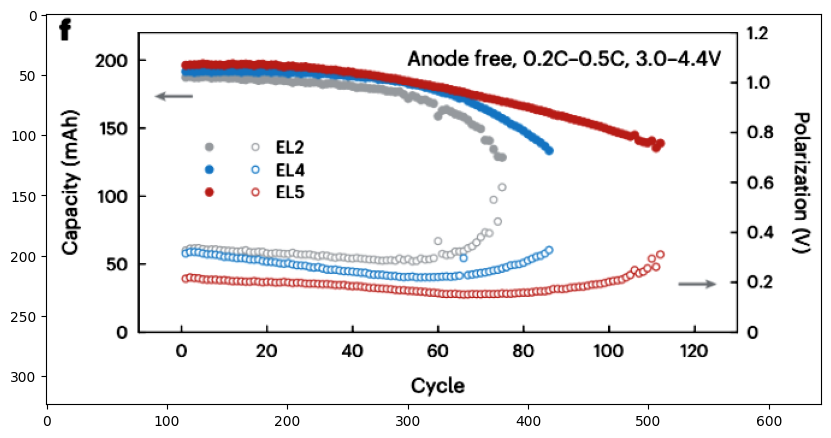

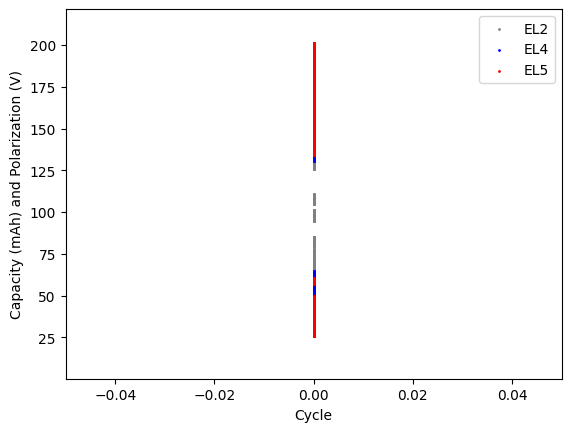

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
blue
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
red
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)
(0.6, 0.0, 0.0)


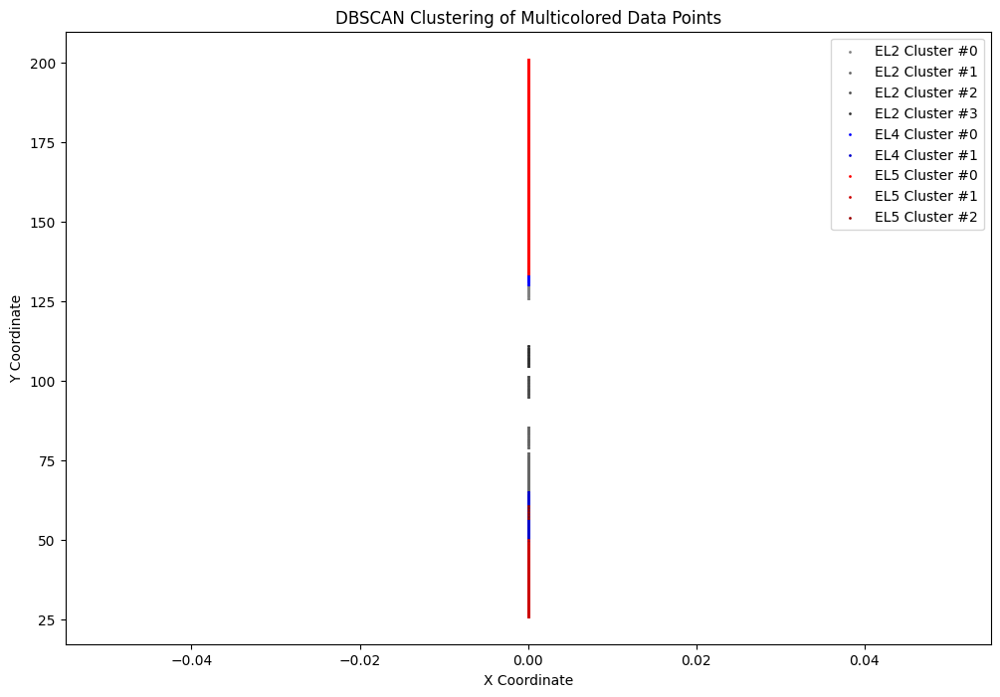

{'topLeft': (69, 9), 'bottomRight': (320, 261)}


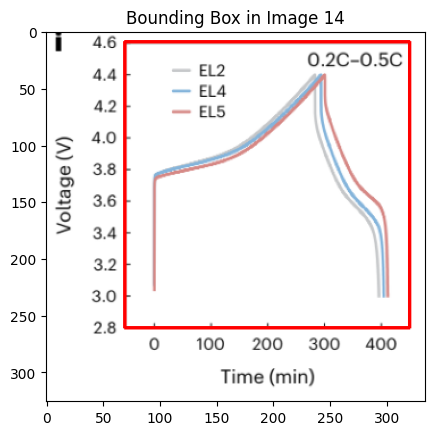

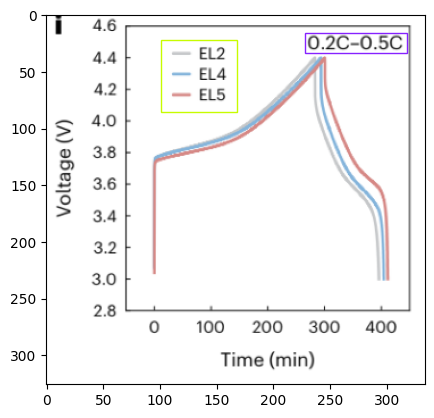

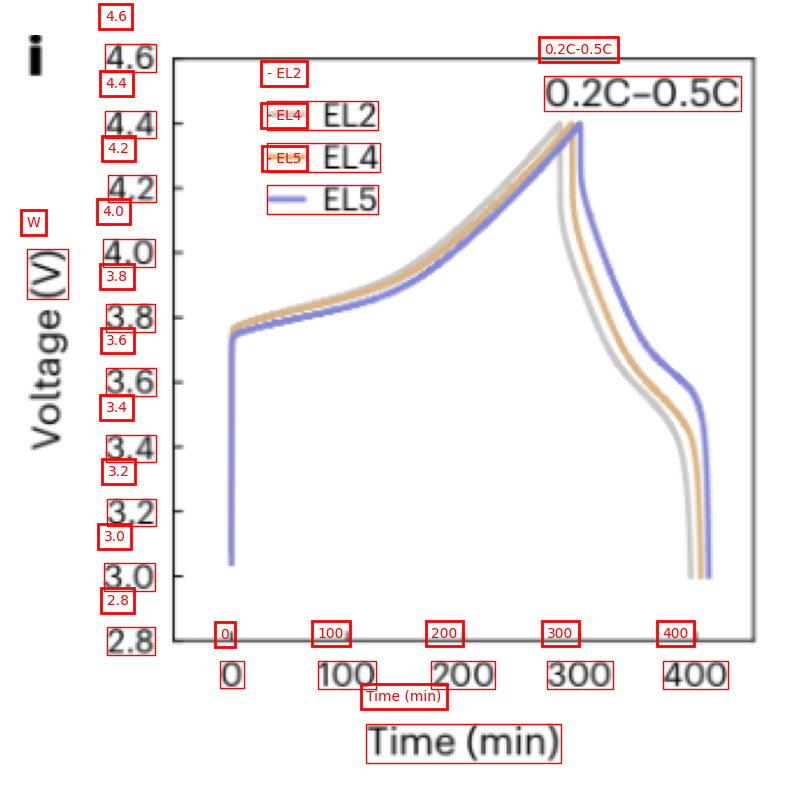

Y MIN 2.8
Y MAX 4.6
SEMANTIC Y MIN 2.8
SEMANTIC Y MAX 4.6
Y
OCR DIFF -251.56810209713876
SEM DIFF 1.7999999999999998
OCR RATIO -139.76005672063266
PIXEL DIFF 0.05287979915738106
REAL DIFF FROM BASE POINT -0.0003783613172330264
Y_MIN 2.800378361317233
Y_MAX 4.603468642710897
SEMANTIC X MIN 2.8
SEMANTIC X MAX 400.0
X
OCR DIFF 243.33902031183243
SEM DIFF 397.2
OCR RATIO 1.6322906186233463
PIXEL DIFF -17.397675566375256
REAL DIFF FROM BASE POINT -28.398062612846942
X_MIN 31.198062612846943
X_MAX 440.9030078873069
X
Predicted [31.198062612846943, 440.9030078873069]
Chat GPT [0, 400]
Y
Predicted [2.800378361317233, 4.603468642710897]
Chat GPT [2.8, 4.6]


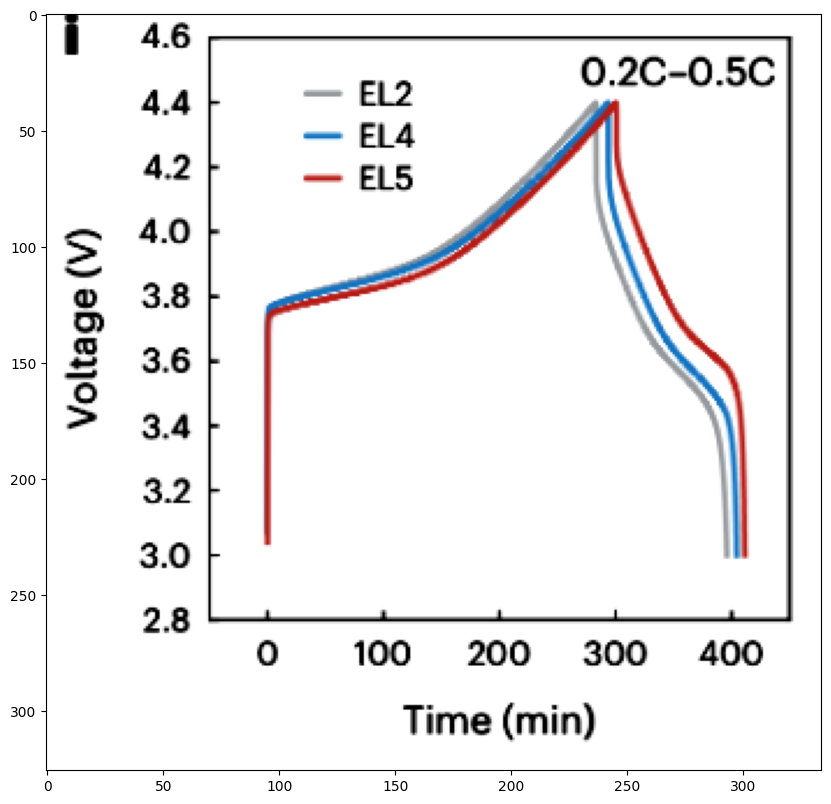

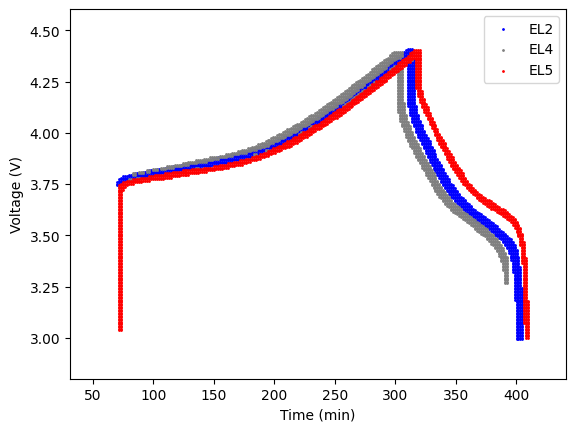

{'topLeft': (69, 17), 'bottomRight': (567, 266)}


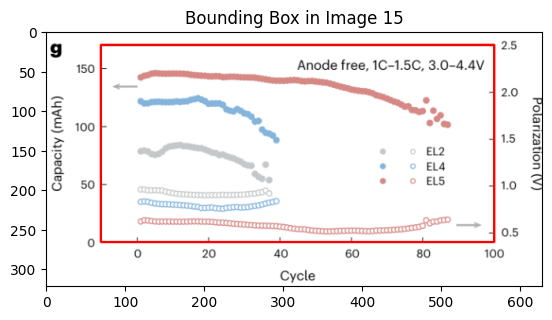

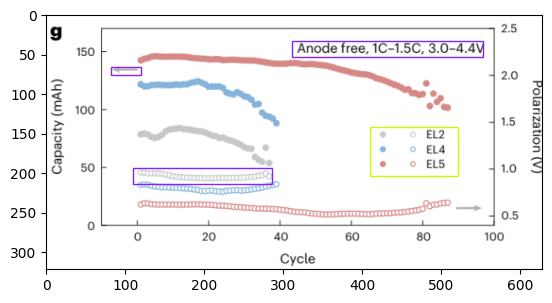

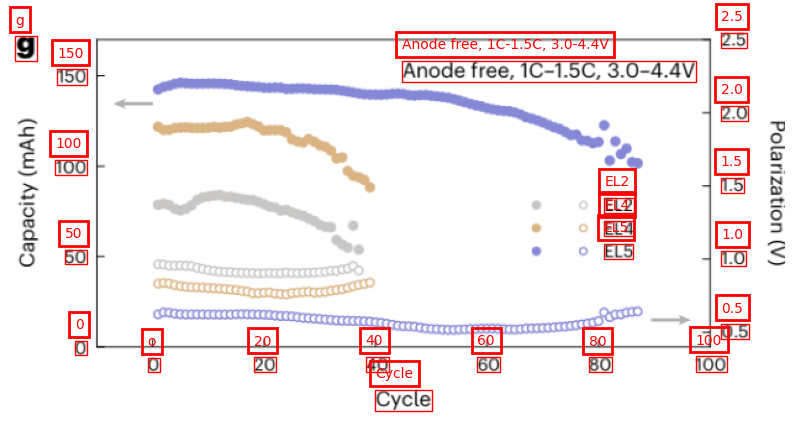

Y MIN 0
Y MAX 150
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 150.0
Y
OCR DIFF -219.88508423417807
SEM DIFF 150.0
OCR RATIO -1.465900561561187
PIXEL DIFF 1.3731517605483532
REAL DIFF FROM BASE POINT -0.9367291319446278
Y_MIN 0.9367291319446278
Y_MAX 170.7981825819757
SEMANTIC X MIN 0.0
SEMANTIC X MAX 100.0
X
OCR DIFF 510.9125428516418
SEM DIFF 100.0
OCR RATIO 0.19572821493450376
PIXEL DIFF -12.225043604150414
REAL DIFF FROM BASE POINT -2.392785962136833
X_MIN 2.392785962136833
X_MAX 99.8654369995197
X
Predicted [2.392785962136833, 99.8654369995197]
Chat GPT [0, 100]
Y
Predicted [0.9367291319446278, 170.7981825819757]
Chat GPT [0, 150]


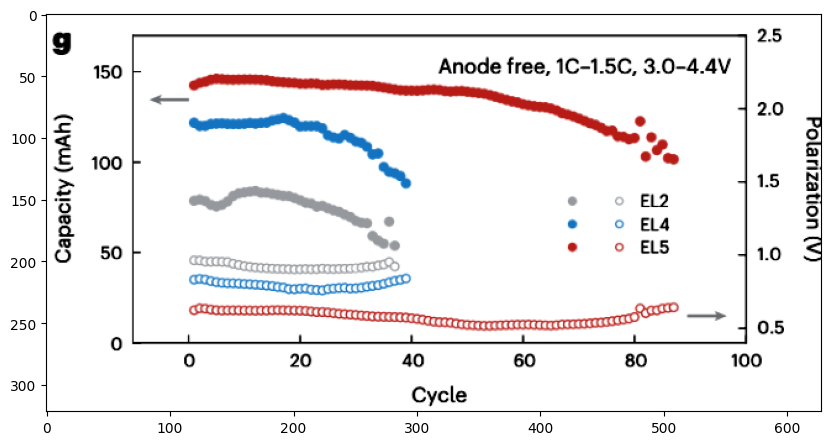

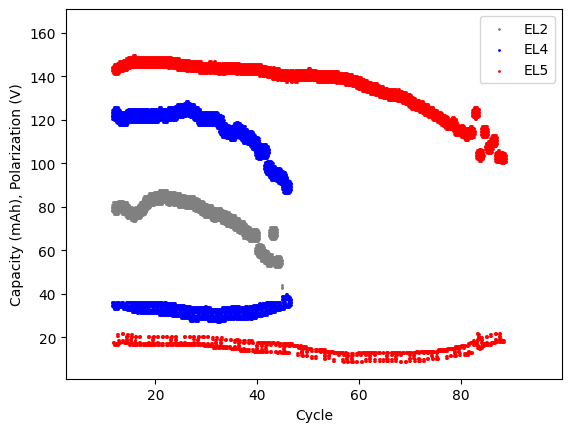

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
blue
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
red
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)
(0.6, 0.0, 0.0)


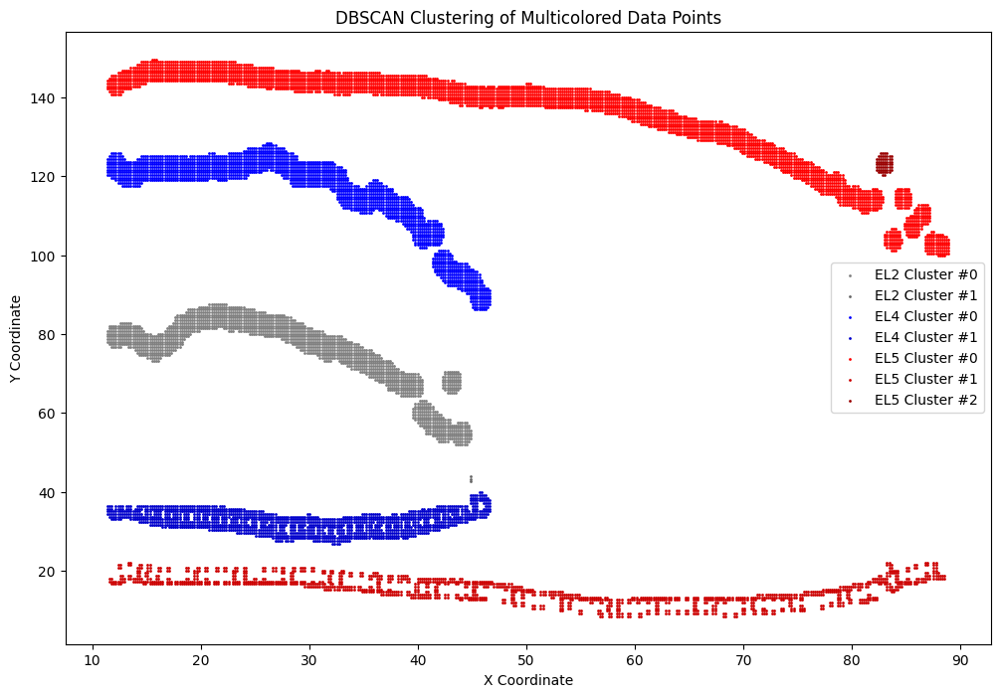

{'topLeft': (80, 32), 'bottomRight': (577, 280)}


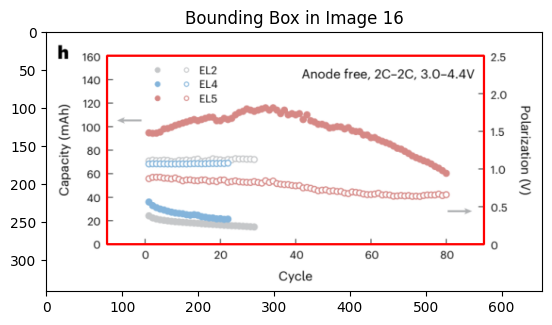

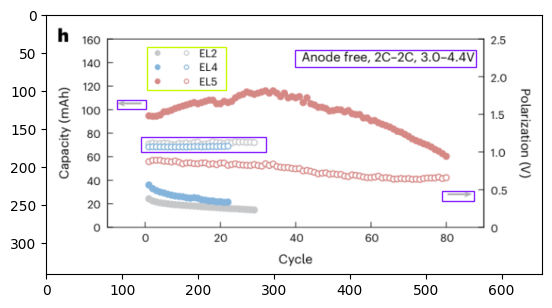

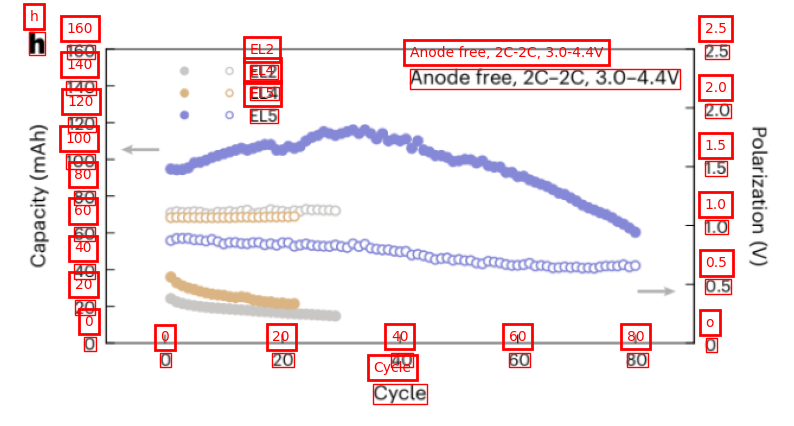

Y MIN 0
Y MAX 160
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 160.0
Y
OCR DIFF -246.66729724779725
SEM DIFF 160.0
OCR RATIO -1.5416706077987328
PIXEL DIFF 0.7380078732967377
REAL DIFF FROM BASE POINT -0.478706585935694
Y_MIN 0.478706585935694
Y_MAX 161.34316021530447
SEMANTIC X MIN 0.0
SEMANTIC X MAX 80.0
X
OCR DIFF 461.7417592462152
SEM DIFF 80.0
OCR RATIO 0.1732570173652877
PIXEL DIFF -13.080449594184756
REAL DIFF FROM BASE POINT -2.2662796824854388
X_MIN 2.2662796824854388
X_MAX 88.37501731303342
X
Predicted [2.2662796824854388, 88.37501731303342]
Chat GPT [0, 80]
Y
Predicted [0.478706585935694, 161.34316021530447]
Chat GPT [0, 160]


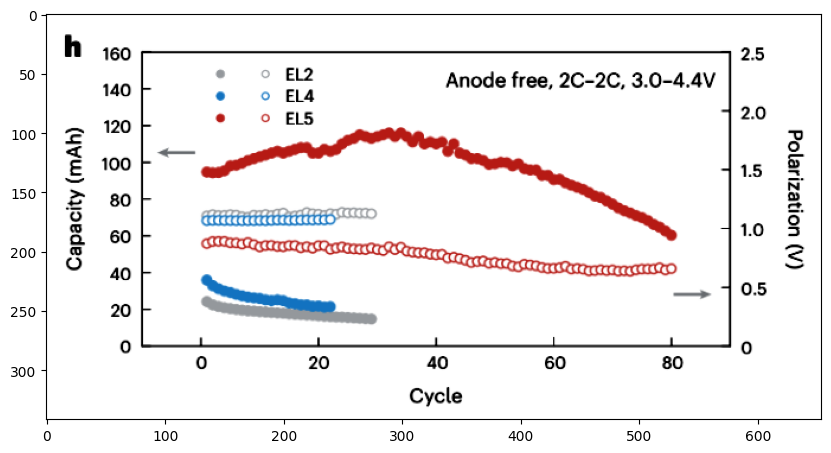

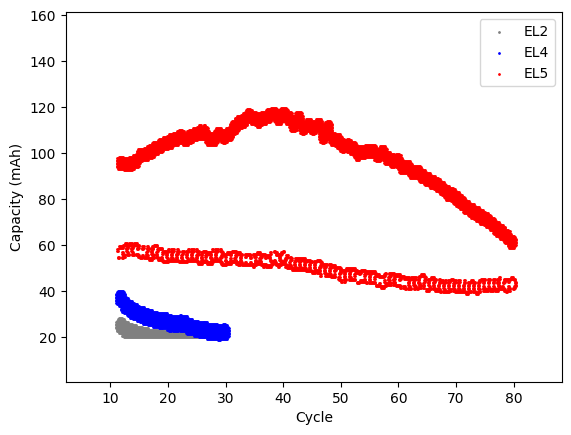

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
blue
(0.0, 0.0, 1.0)
red
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)


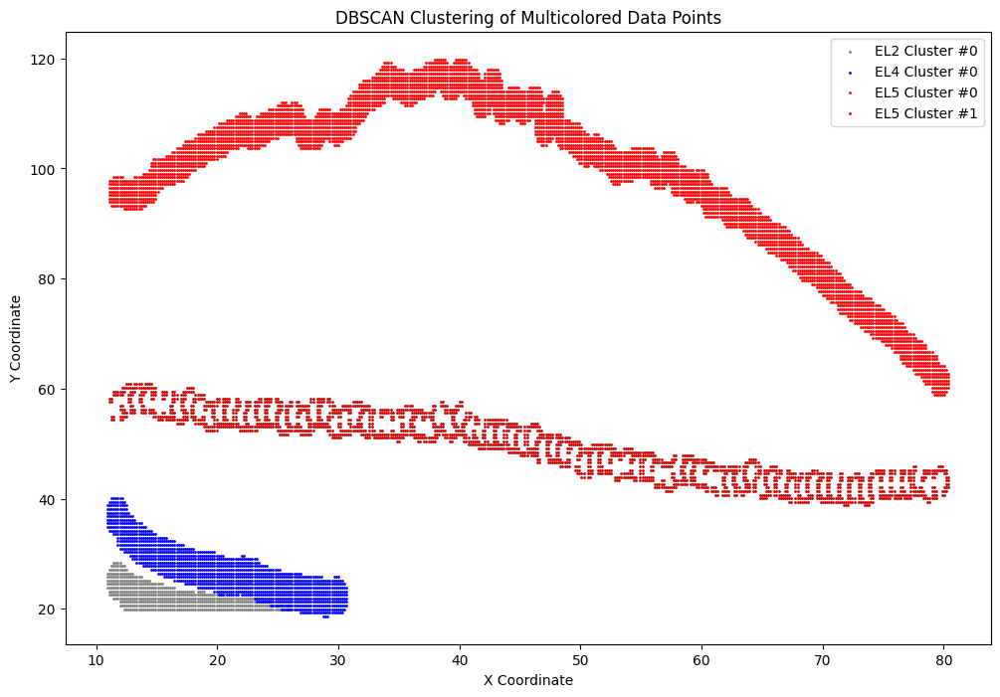

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [79, 26], 'bottomRight': [330, 277]}


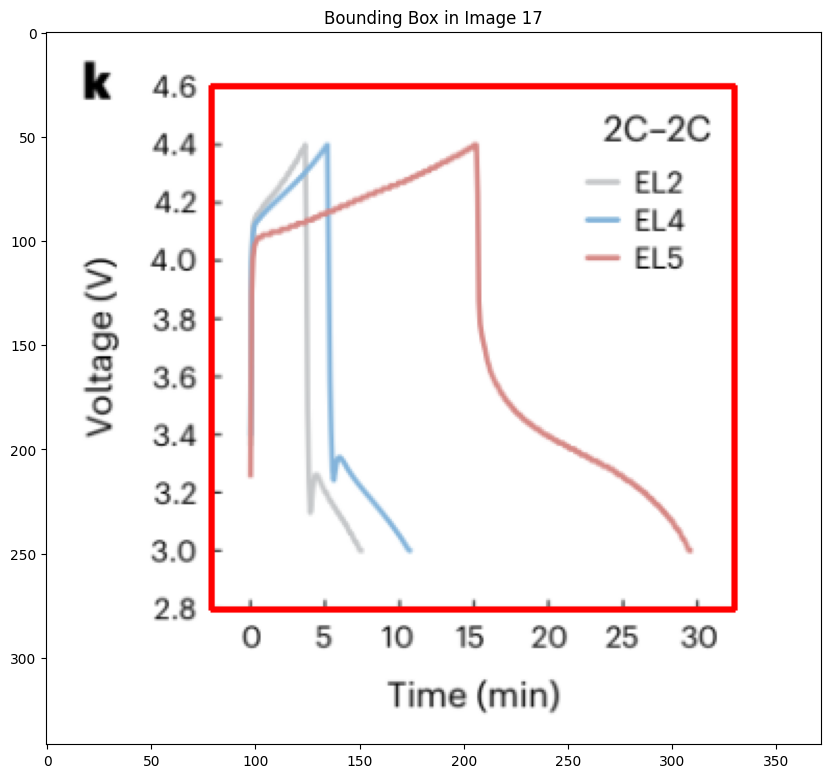

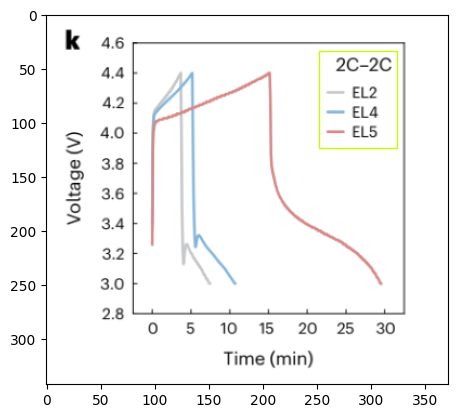

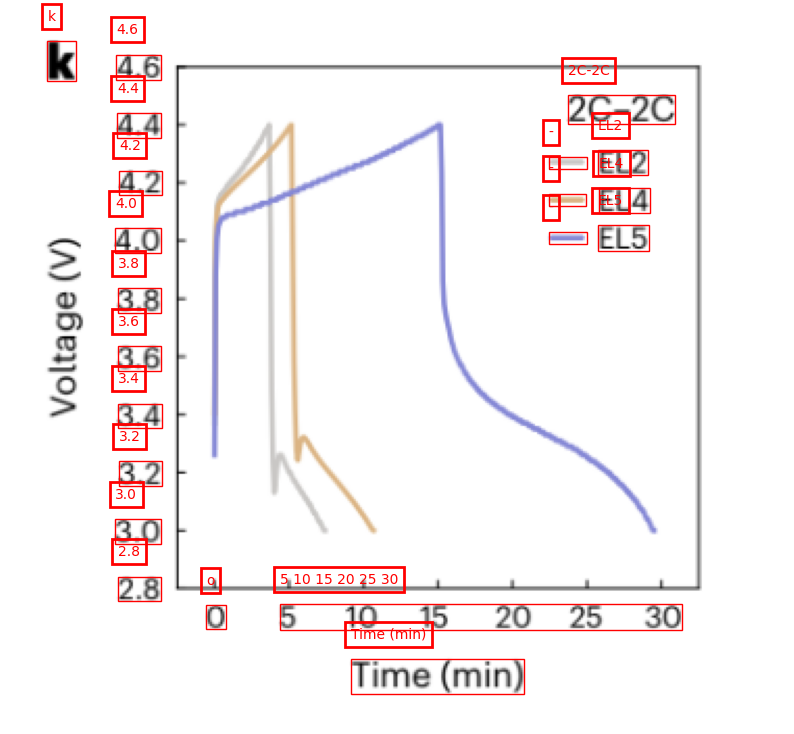

Y MIN 2.8
Y MAX 4.6
SEMANTIC Y MIN 2.8
SEMANTIC Y MAX 4.6
Y
OCR DIFF -250.40643122792244
SEM DIFF 1.7999999999999998
OCR RATIO -139.11468401551247
PIXEL DIFF -0.311822135001421
REAL DIFF FROM BASE POINT 0.002241475349695293
Y_MIN 2.7977585246503045
Y_MAX 4.602025283233542
x is in fault condition
X
Predicted [0, 30]
Chat GPT [0, 30]
Y
Predicted [2.7977585246503045, 4.602025283233542]
Chat GPT [2.8, 4.6]


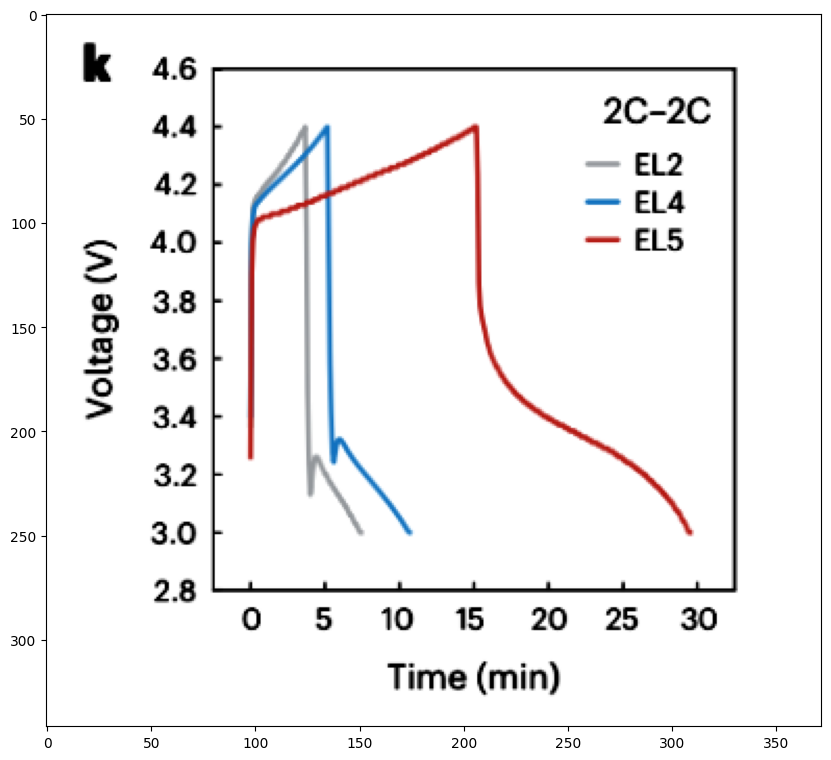

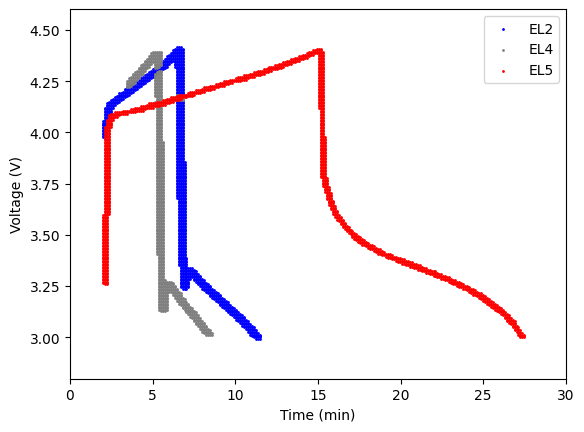

{'topLeft': (69, 18), 'bottomRight': (320, 269)}


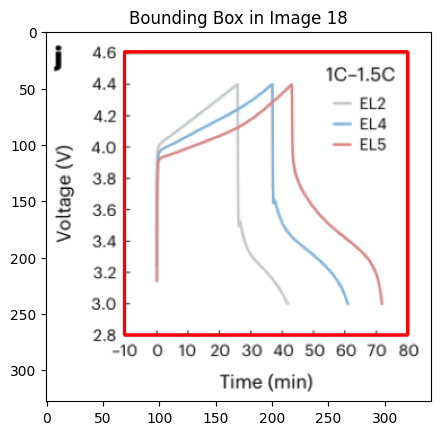

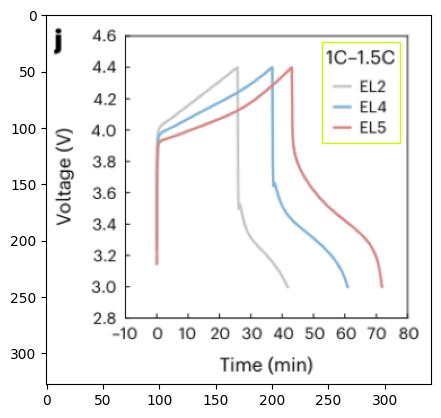

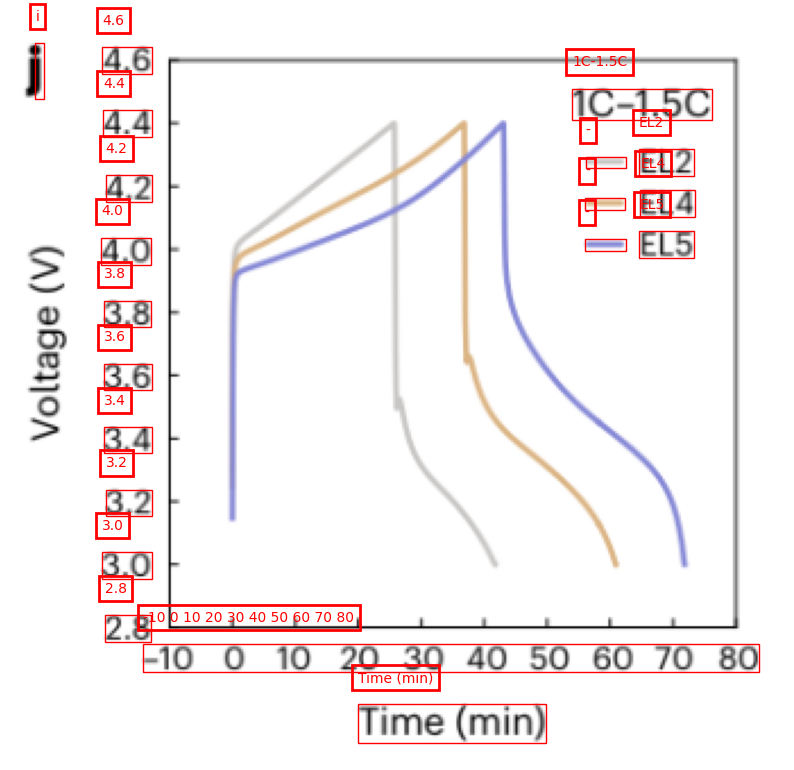

Y MIN 2.8
Y MAX 4.6
SEMANTIC Y MIN 2.8
SEMANTIC Y MAX 4.6
Y
OCR DIFF -250.69724869728088
SEM DIFF 1.7999999999999998
OCR RATIO -139.27624927626718
PIXEL DIFF 0.4403594881296158
REAL DIFF FROM BASE POINT -0.0031617701540491835
Y_MIN 2.803161770154049
Y_MAX 4.605335516965098
SEMANTIC X MIN 2.8
SEMANTIC X MAX 2.8
X
OCR DIFF 0.0
SEM DIFF 0.0
x is in fault condition
X
Predicted [-10, 70]
Chat GPT [-10, 70]
Y
Predicted [2.803161770154049, 4.605335516965098]
Chat GPT [3.0, 4.6]


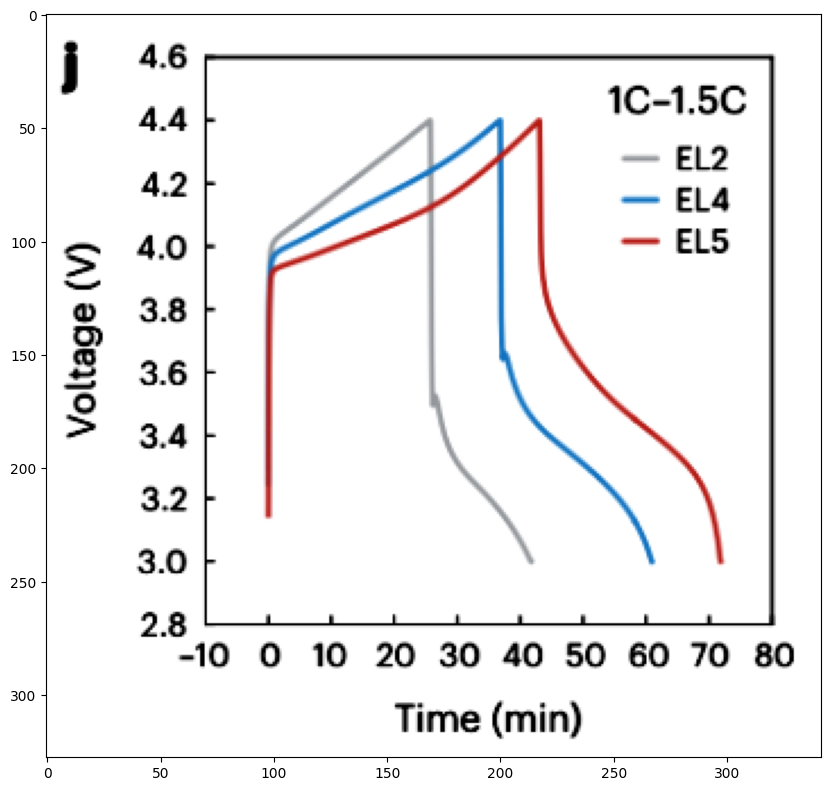

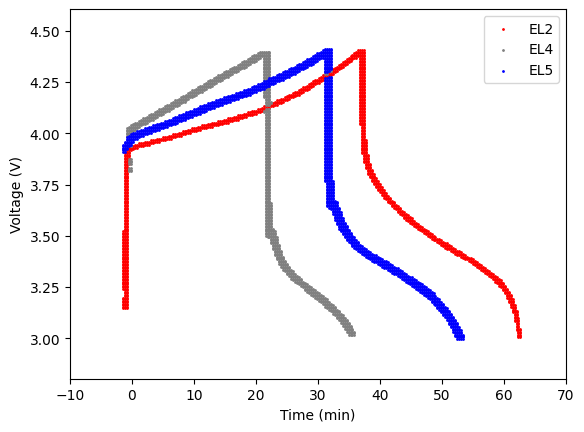

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [87, 26], 'bottomRight': [380, 318]}


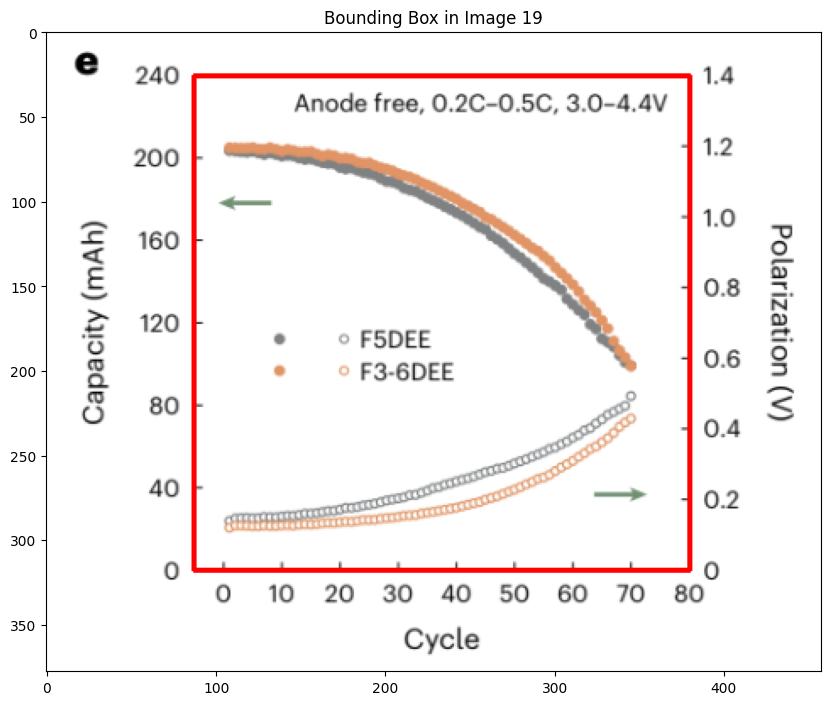

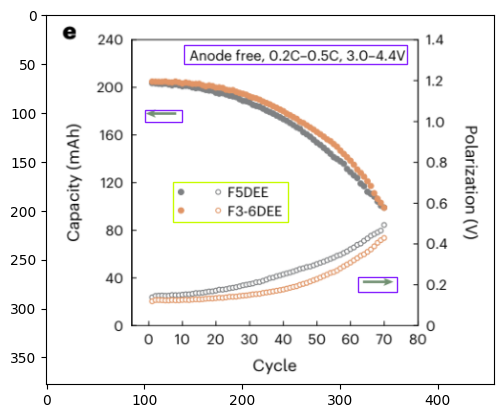

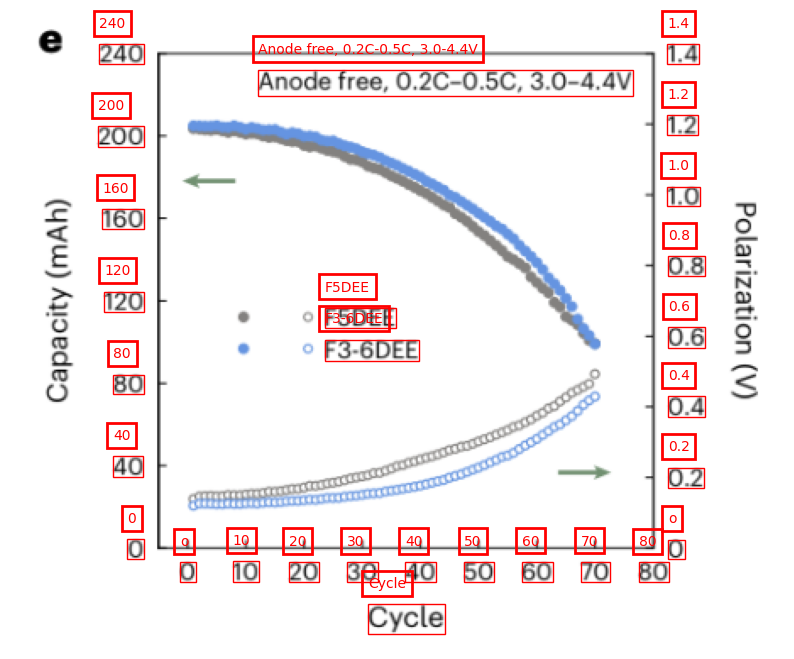

Y MIN 0
Y MAX 240
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 240.0
Y
OCR DIFF -292.61655566096306
SEM DIFF 240.0
OCR RATIO -1.2192356485873461
PIXEL DIFF 0.5369644537568092
REAL DIFF FROM BASE POINT -0.44041072320921487
Y_MIN 0.44041072320921487
Y_MAX 239.93472040675775
SEMANTIC X MIN 0.0
SEMANTIC X MAX 80.0
X
OCR DIFF 306.0719712153077
SEM DIFF 80.0
OCR RATIO 0.2613764327466746
PIXEL DIFF -13.160181682556868
REAL DIFF FROM BASE POINT -3.4397613424848443
X_MIN 3.4397613424848443
X_MAX 80.0230561372605
X
Predicted [3.4397613424848443, 80.0230561372605]
Chat GPT [0, 80]
Y
Predicted [0.44041072320921487, 239.93472040675775]
Chat GPT [0, 240]


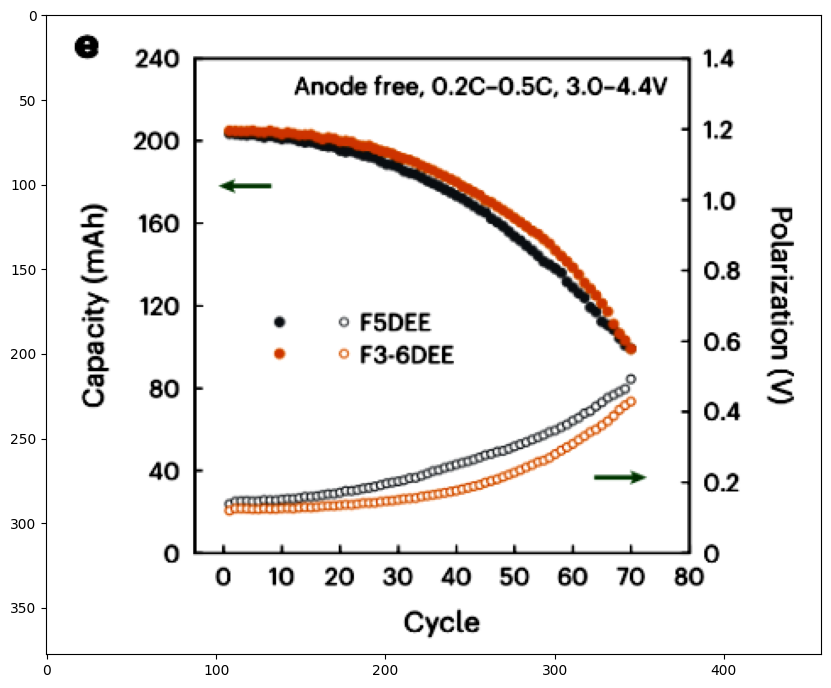

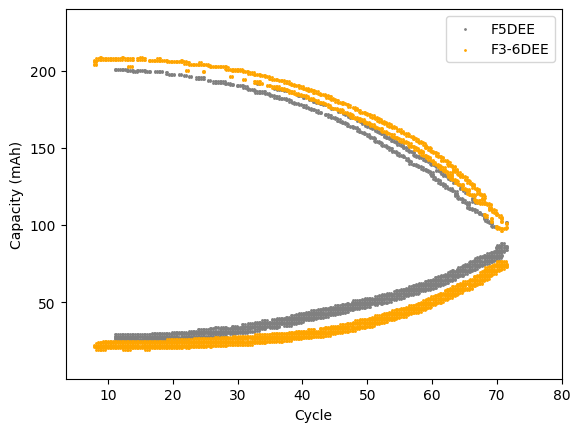

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
orange
(1.0, 0.6470588235294118, 0.0)
(0.8, 0.5176470588235295, 0.0)
(0.6, 0.3882352941176471, 0.0)


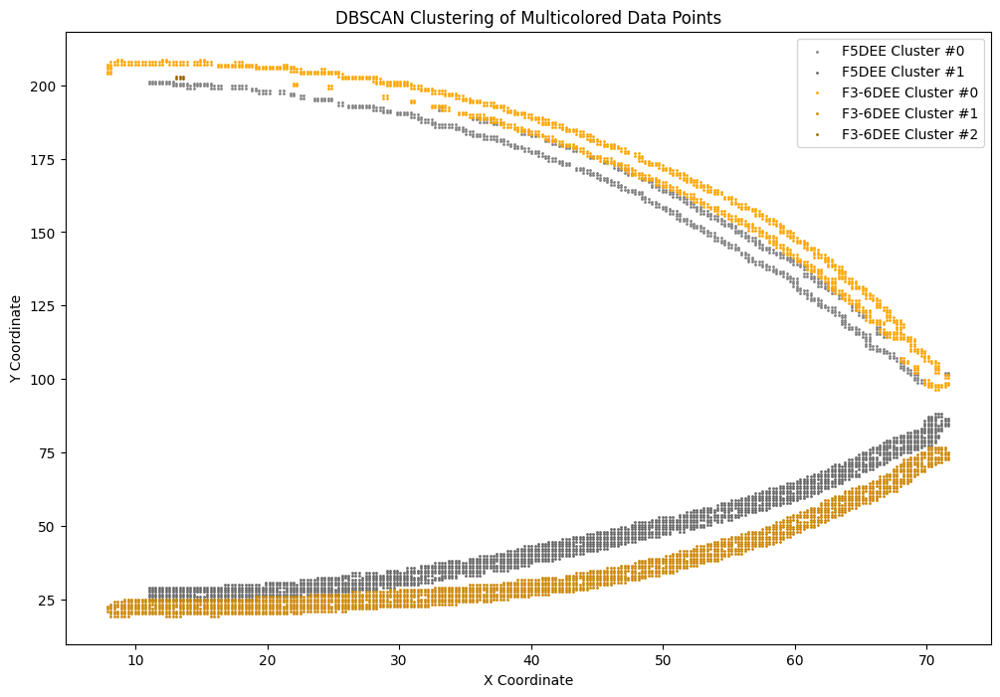

{'topLeft': (79, 29), 'bottomRight': (372, 322)}


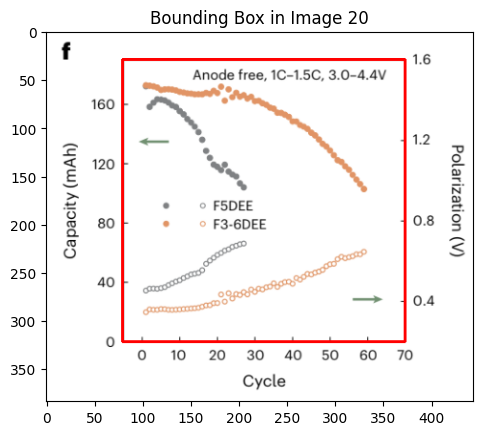

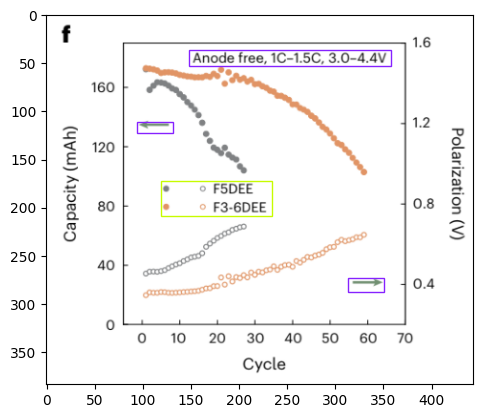

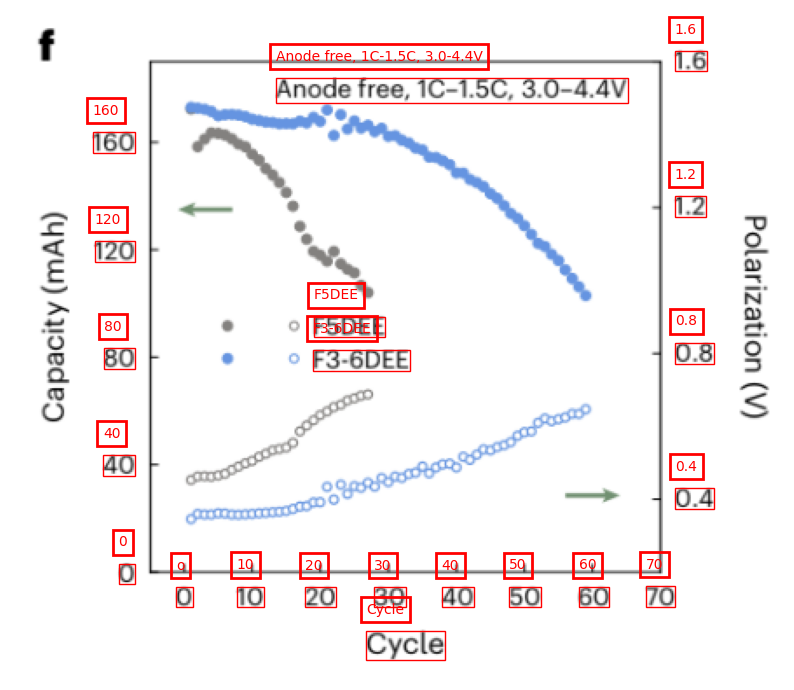

Y MIN 0
Y MAX 160
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 160.0
Y
OCR DIFF -246.83155810832977
SEM DIFF 160.0
OCR RATIO -1.5426972381770612
PIXEL DIFF 0.6316367387771606
REAL DIFF FROM BASE POINT -0.4094366173388231
Y_MIN 0.4094366173388231
Y_MAX 190.33652843363421
SEMANTIC X MIN 0.0
SEMANTIC X MAX 70.0
X
OCR DIFF 305.58698357641697
SEM DIFF 70.0
OCR RATIO 0.22906734829068845
PIXEL DIFF -12.500037156045437
REAL DIFF FROM BASE POINT -2.863350364870407
X_MIN 2.863350364870407
X_MAX 69.98008341404213
X
Predicted [2.863350364870407, 69.98008341404213]
Chat GPT [0, 70]
Y
Predicted [0.4094366173388231, 190.33652843363421]
Chat GPT [0, 160]


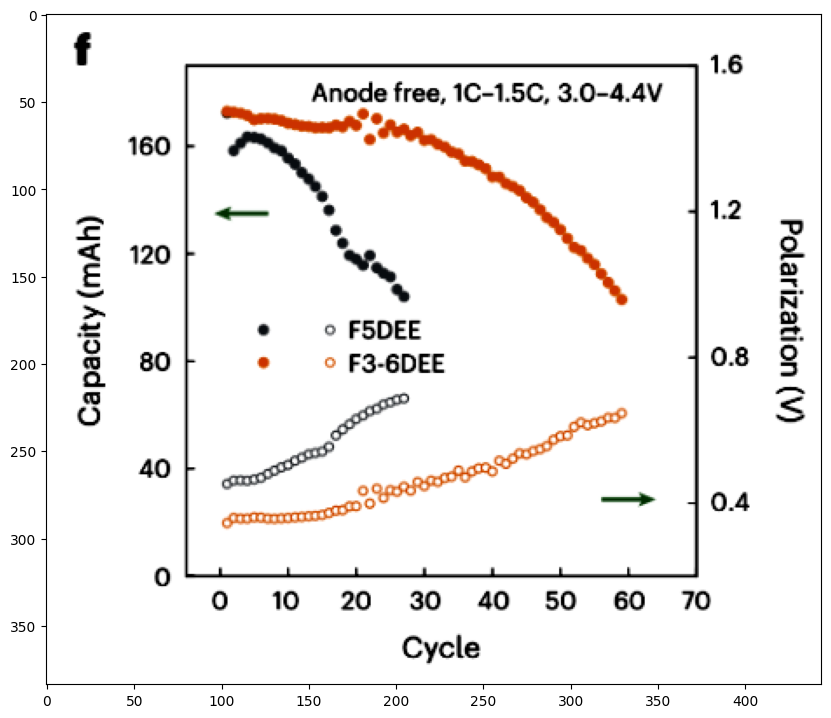

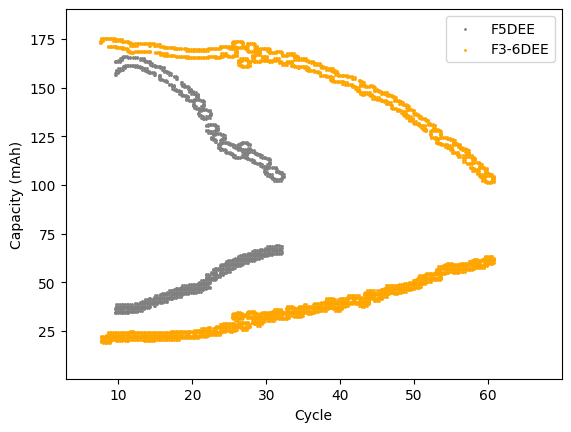

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
orange
(1.0, 0.6470588235294118, 0.0)
(0.8, 0.5176470588235295, 0.0)


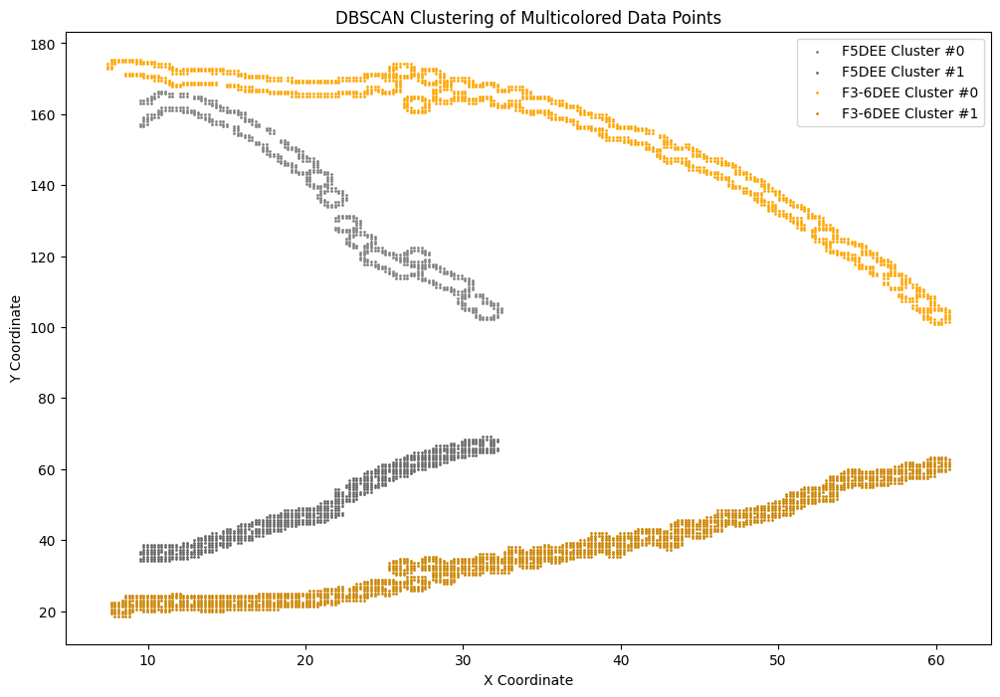

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
{'topLeft': [84, 30], 'bottomRight': [377, 322]}


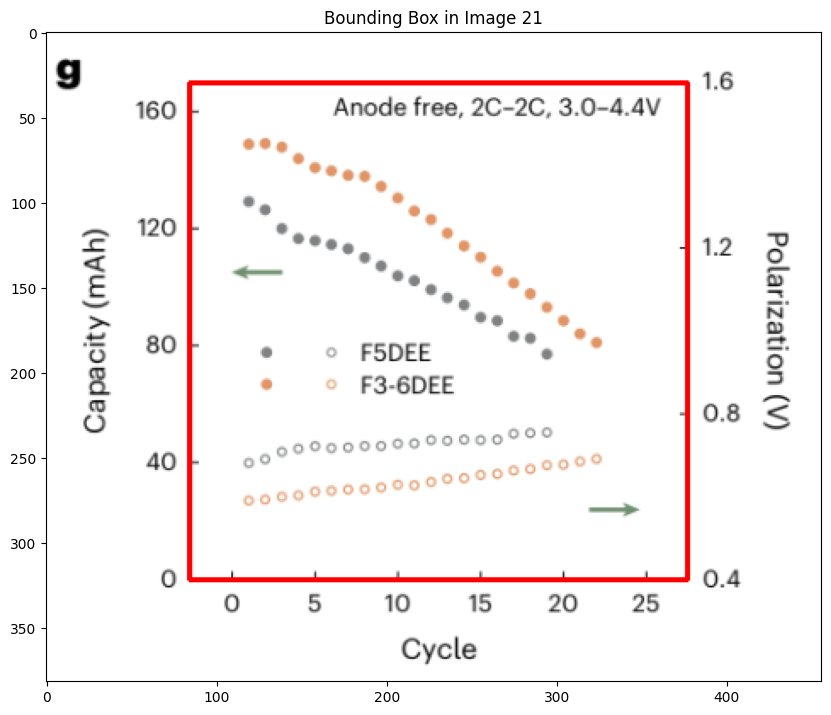

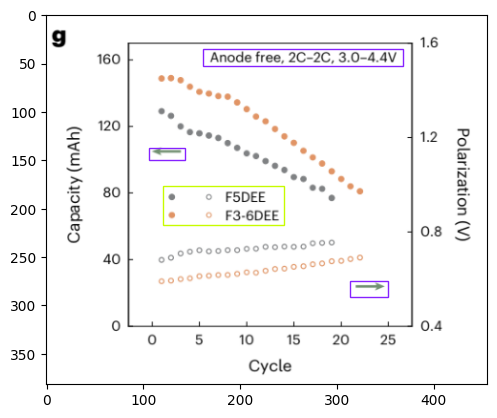

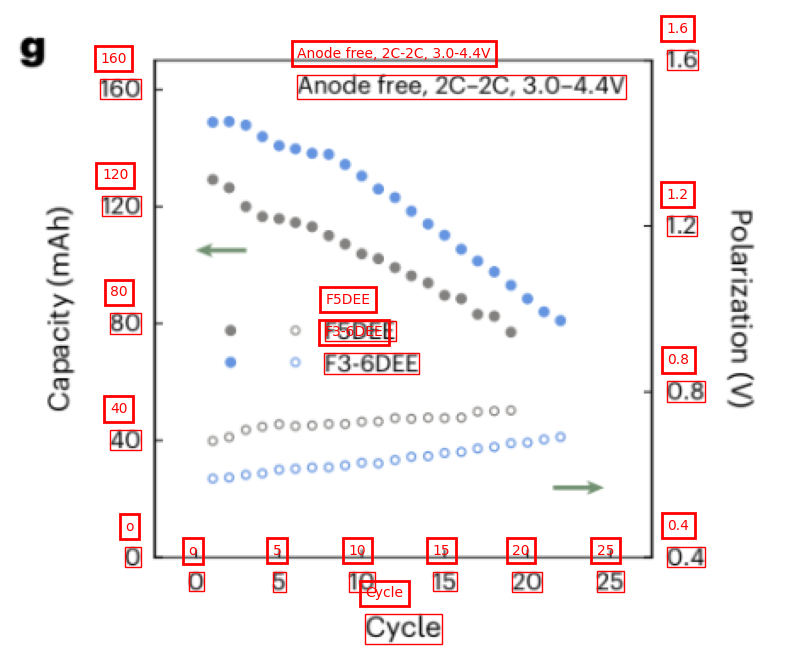

Y MIN 40
Y MAX 160
SEMANTIC Y MIN 40.0
SEMANTIC Y MAX 160.0
Y
OCR DIFF -206.42152911238372
SEM DIFF 120.0
OCR RATIO -1.7201794092698643
PIXEL DIFF -69.26556494086981
REAL DIFF FROM BASE POINT 40.2664771869754
Y_MIN -0.26647718697540057
Y_MAX 169.4832584664355
SEMANTIC X MIN 5.0
SEMANTIC X MAX 25.0
X
OCR DIFF 194.71473714709282
SEM DIFF 20.0
OCR RATIO 0.10271436200995641
PIXEL DIFF 73.97851900756359
REAL DIFF FROM BASE POINT 7.598656382303329
X_MIN -2.5986563823033286
X_MAX 27.4966516866139
X
Predicted [-2.5986563823033286, 27.4966516866139]
Chat GPT [0, 25]
Y
Predicted [-0.26647718697540057, 169.4832584664355]
Chat GPT [40, 160]


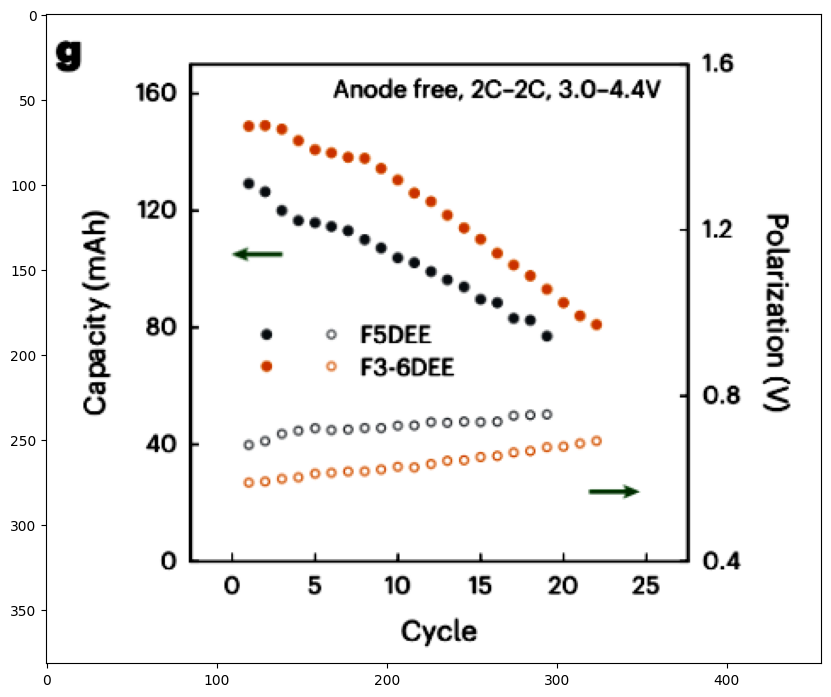

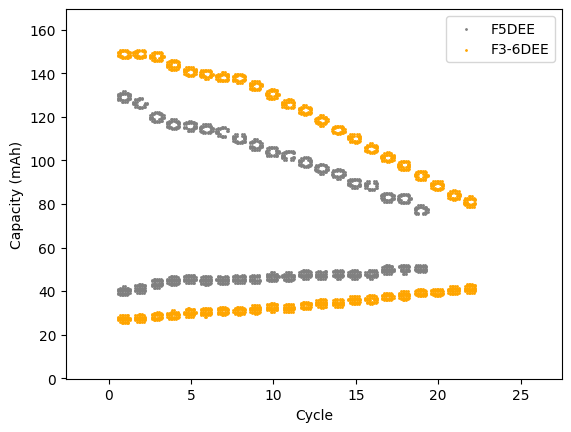

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
orange
(1.0, 0.6470588235294118, 0.0)
(0.8, 0.5176470588235295, 0.0)


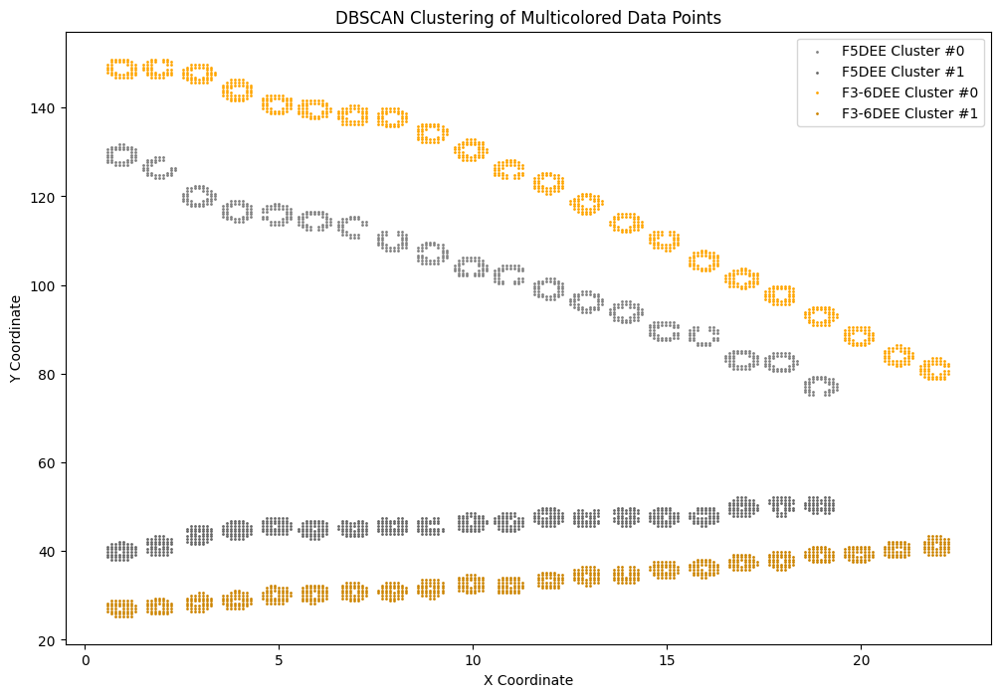

{'topLeft': (233, 36), 'bottomRight': (1200, 816)}


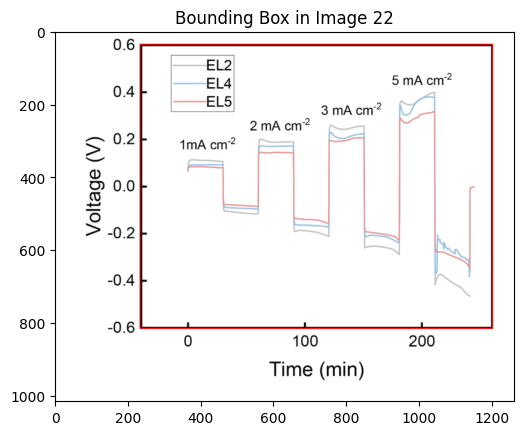

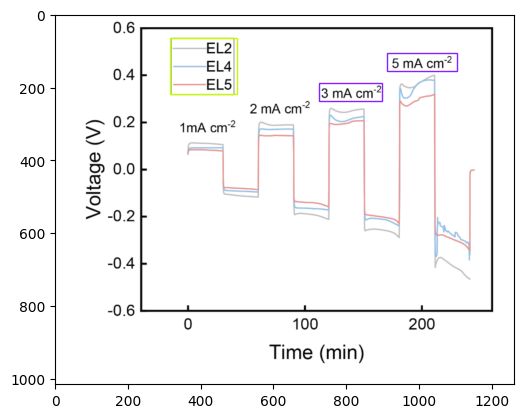

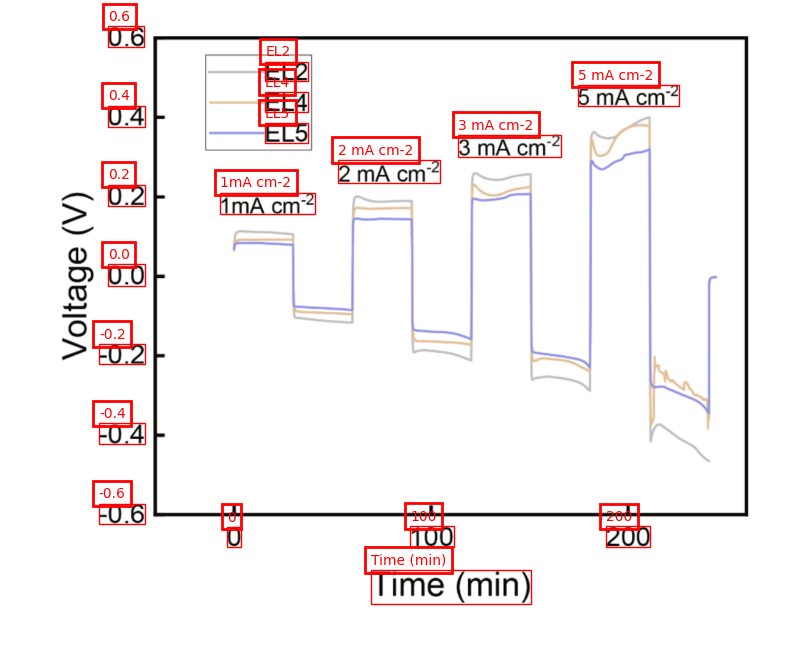

Y MIN -0.6
Y MAX 0.6
SEMANTIC Y MIN -0.6
SEMANTIC Y MAX 0.6
Y
OCR DIFF -776.9835399091244
SEM DIFF 1.2
OCR RATIO -647.4862832576036
PIXEL DIFF -2.631559118628502
REAL DIFF FROM BASE POINT 0.004064270065133613
Y_MIN -0.6040642700651336
Y_MAX 0.6005944542489928
SEMANTIC X MIN 0.0
SEMANTIC X MAX 200.0
X
OCR DIFF 641.5128485709429
SEM DIFF 200.0
OCR RATIO 0.31176304643862895
PIXEL DIFF 131.48579359799623
REAL DIFF FROM BASE POINT 40.99241157551208
X_MIN -40.99241157551208
X_MAX 260.4824543306421
X
Predicted [-40.99241157551208, 260.4824543306421]
Chat GPT [0, 250]
Y
Predicted [-0.6040642700651336, 0.6005944542489928]
Chat GPT [-0.6, 0.6]


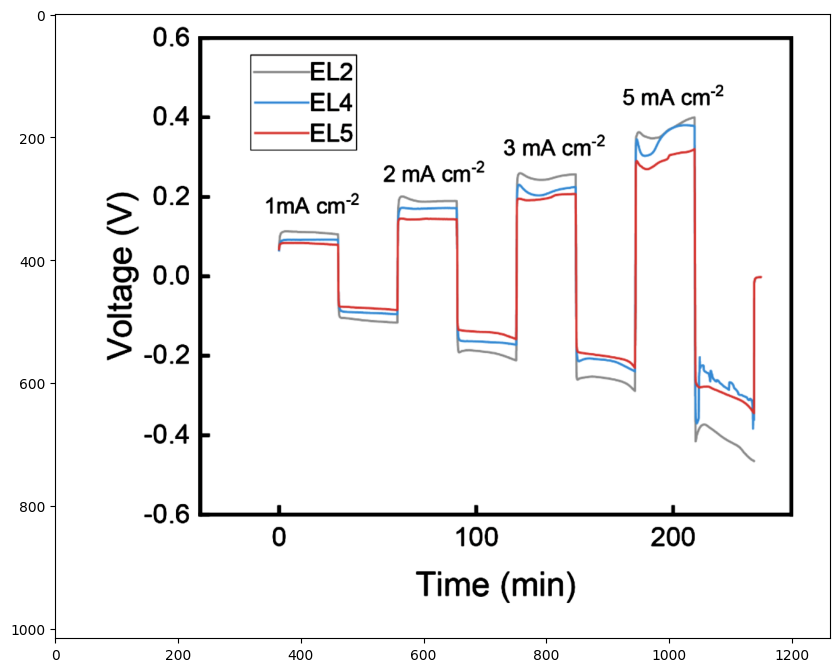

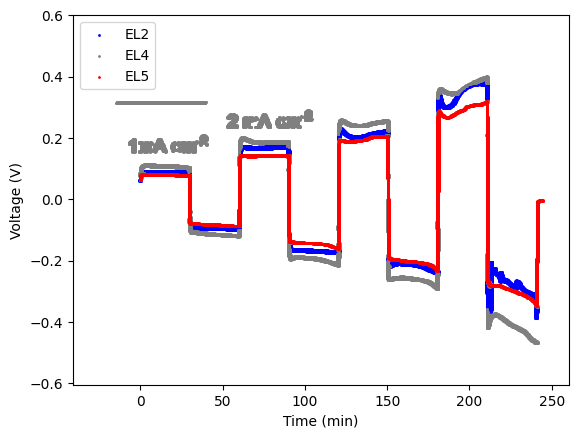

{'topLeft': (156, 31), 'bottomRight': (982, 697)}


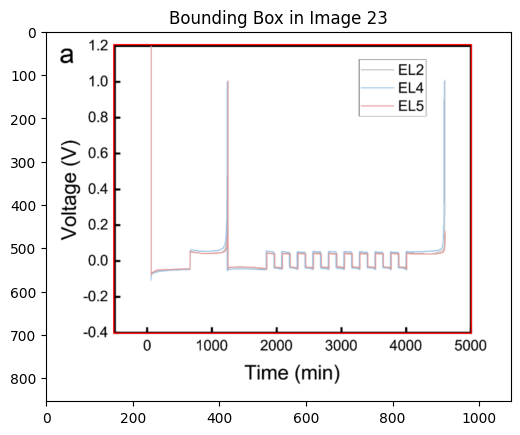

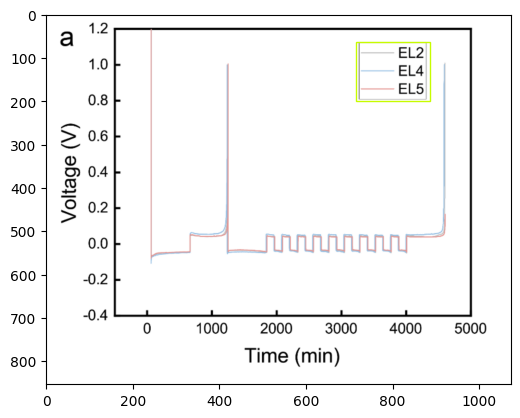

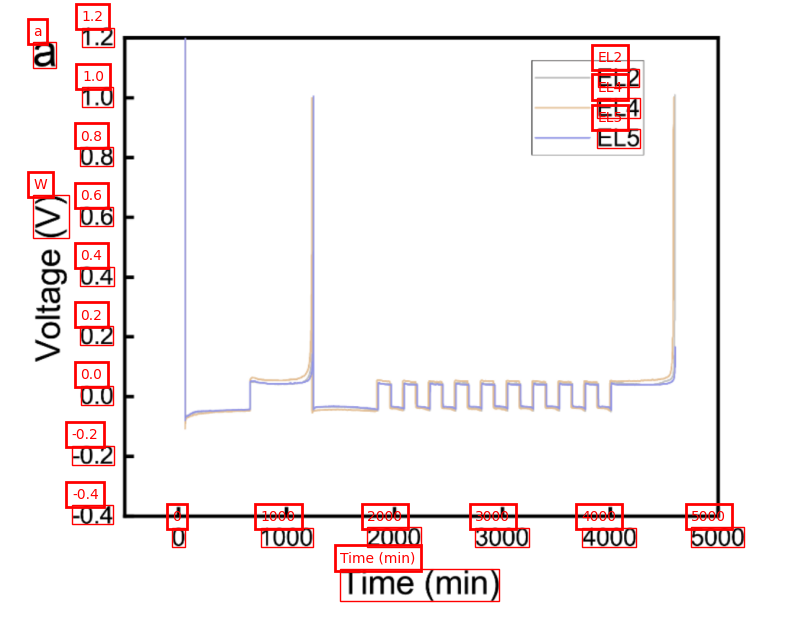

Y MIN -0.4
Y MAX 1.2
SEMANTIC Y MIN -0.4
SEMANTIC Y MAX 1.2
Y
OCR DIFF -662.0936190448701
SEM DIFF 1.6
OCR RATIO -413.80851190304384
PIXEL DIFF -3.0251653473824263
REAL DIFF FROM BASE POINT 0.007310544032722141
Y_MIN -0.40731054403272215
Y_MAX 1.2021295250880533
SEMANTIC X MIN 0.0
SEMANTIC X MAX 5000.0
X
OCR DIFF 747.15454249084
SEM DIFF 5000.0
OCR RATIO 6.692055947797841
PIXEL DIFF 77.11276135593653
REAL DIFF FROM BASE POINT 516.0429132831106
X_MIN -516.0429132831106
X_MAX 5011.595299597906
X
Predicted [-516.0429132831106, 5011.595299597906]
Chat GPT [0, 5000]
Y
Predicted [-0.40731054403272215, 1.2021295250880533]
Chat GPT [-0.4, 1.2]


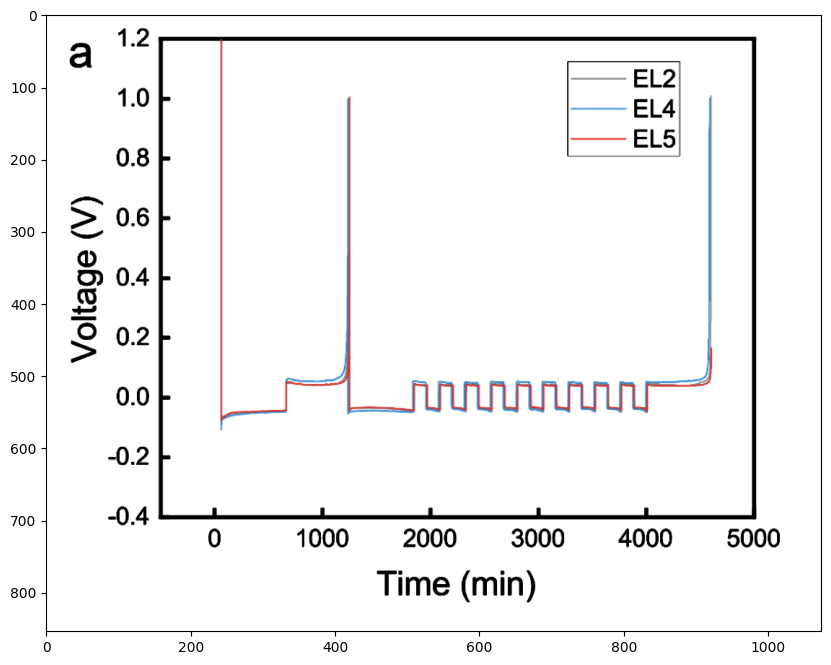

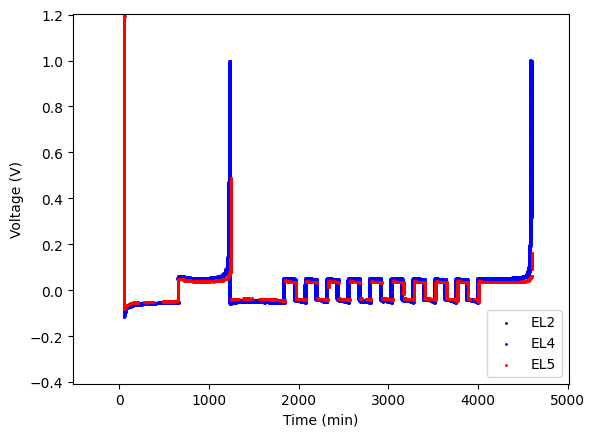

{'topLeft': (172, 36), 'bottomRight': (998, 701)}


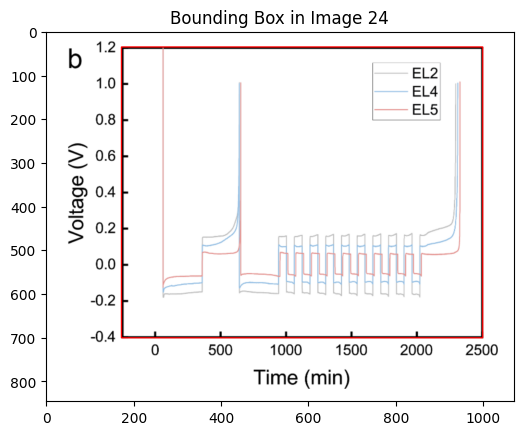

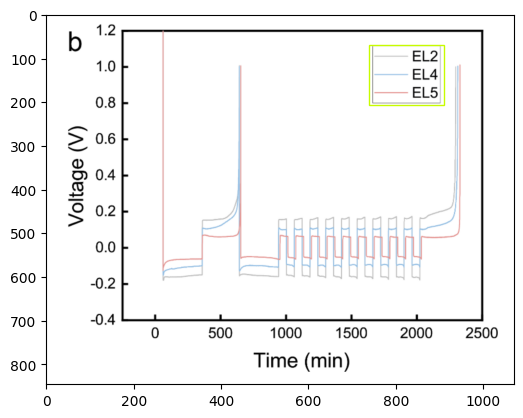

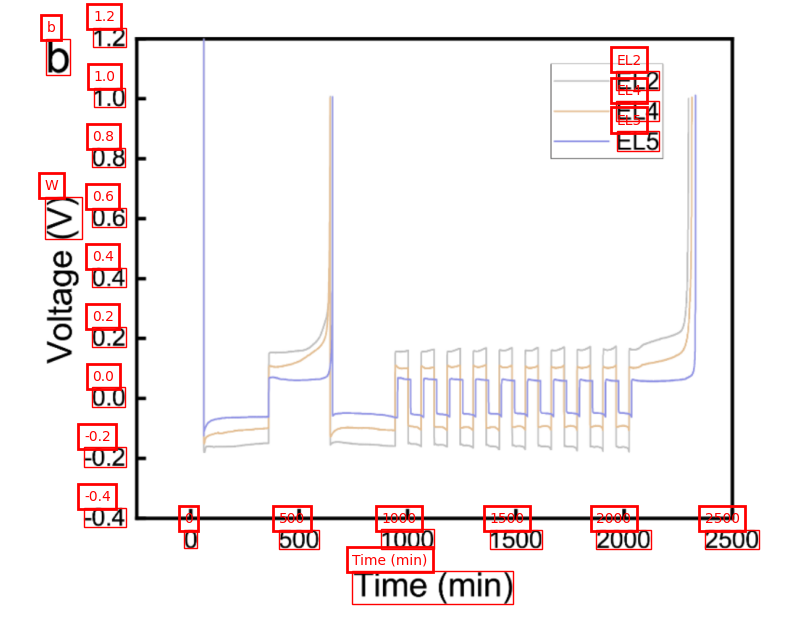

Y MIN -0.4
Y MAX 1.2
SEMANTIC Y MIN -0.4
SEMANTIC Y MAX 1.2
Y
OCR DIFF -662.2213710118085
SEM DIFF 1.6
OCR RATIO -413.8883568823803
PIXEL DIFF -2.928939176723361
REAL DIFF FROM BASE POINT 0.007076640664128934
Y_MIN -0.40707664066412896
Y_MAX 1.1996368339770074
SEMANTIC X MIN 0.0
SEMANTIC X MAX 2500.0
X
OCR DIFF 747.0159425120801
SEM DIFF 2500.0
OCR RATIO 3.3466487898410175
PIXEL DIFF 76.95074632950127
REAL DIFF FROM BASE POINT 257.52712208098853
X_MIN -257.52712208098853
X_MAX 2506.804778327692
X
Predicted [-257.52712208098853, 2506.804778327692]
Chat GPT [0, 2500]
Y
Predicted [-0.40707664066412896, 1.1996368339770074]
Chat GPT [-0.4, 1.2]


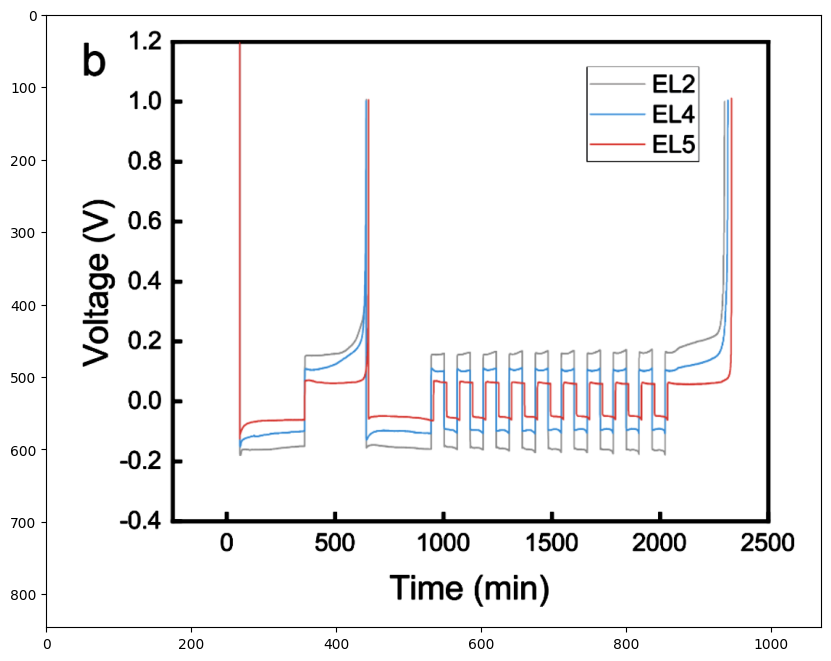

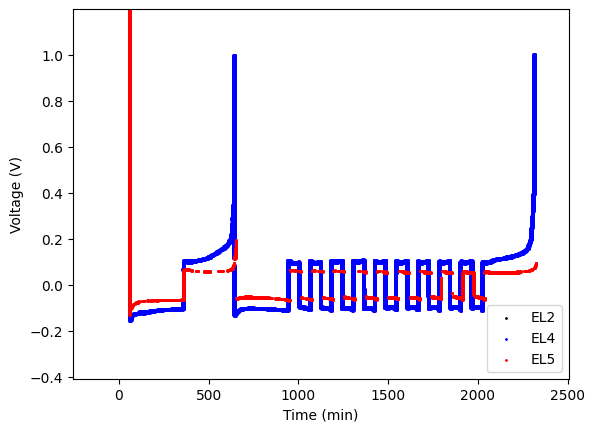

{'topLeft': (175, 28), 'bottomRight': (1219, 549)}


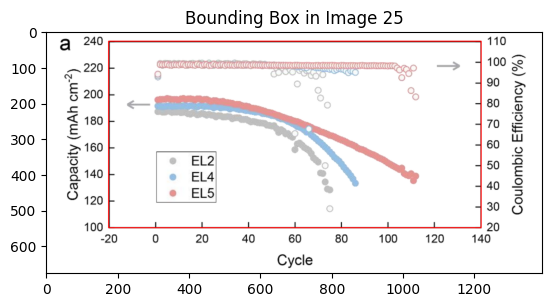

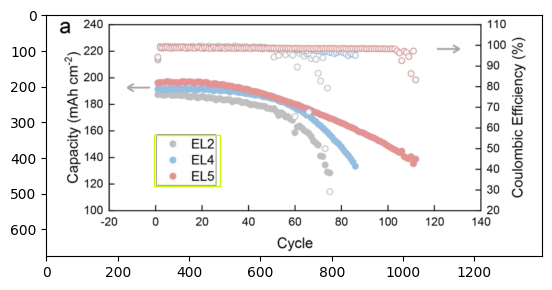

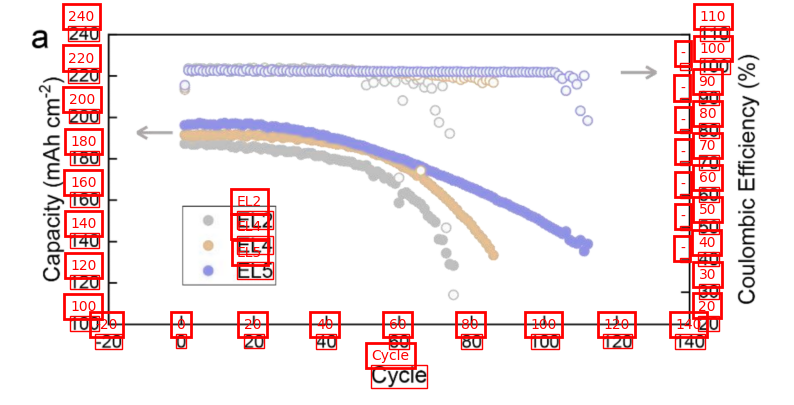

Y MIN 100
Y MAX 240
SEMANTIC Y MIN 100.0
SEMANTIC Y MAX 240.0
Y
OCR DIFF -519.5225781053305
SEM DIFF 140.0
OCR RATIO -3.7108755578952177
PIXEL DIFF -2.300386890769005
REAL DIFF FROM BASE POINT 0.619904077859665
Y_MIN 99.38009592214034
Y_MAX 239.77822888877301
SEMANTIC X MIN -20.0
SEMANTIC X MAX 140.0
X
OCR DIFF 1043.5642710700631
SEM DIFF 160.0
OCR RATIO 0.15332069565388357
PIXEL DIFF 1.061048749834299
REAL DIFF FROM BASE POINT 0.1626807324472782
X_MIN -20.162680732447278
X_MAX 139.90412553020715
X
Predicted [-20.162680732447278, 139.90412553020715]
Chat GPT [-20, 140]
Y
Predicted [99.38009592214034, 239.77822888877301]
Chat GPT [100, 240]


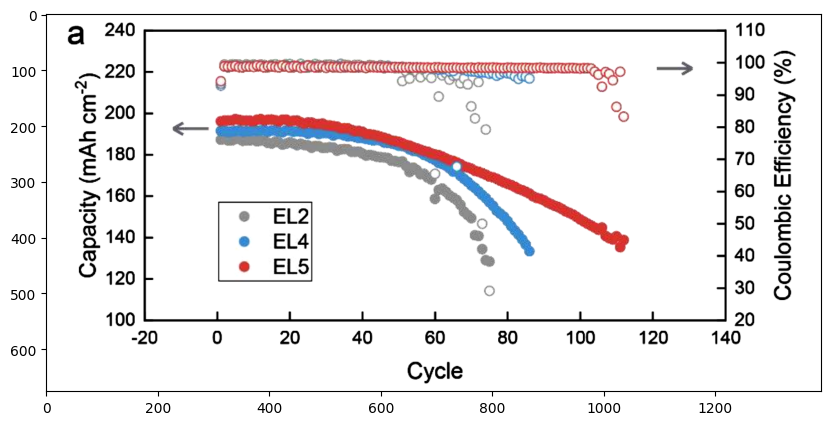

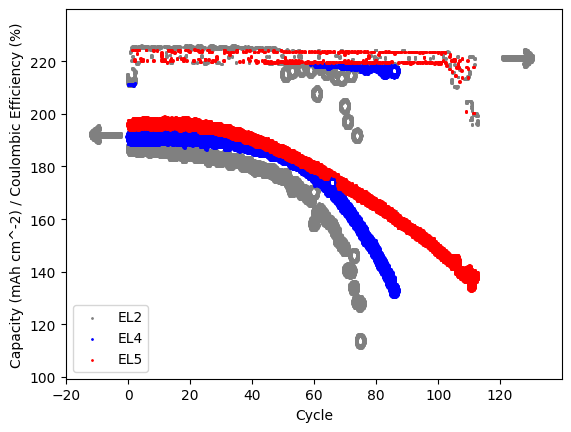

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
(0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
(0.0, 0.0, 0.0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
blue
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
red
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)
(0.6, 0.0, 0.0)


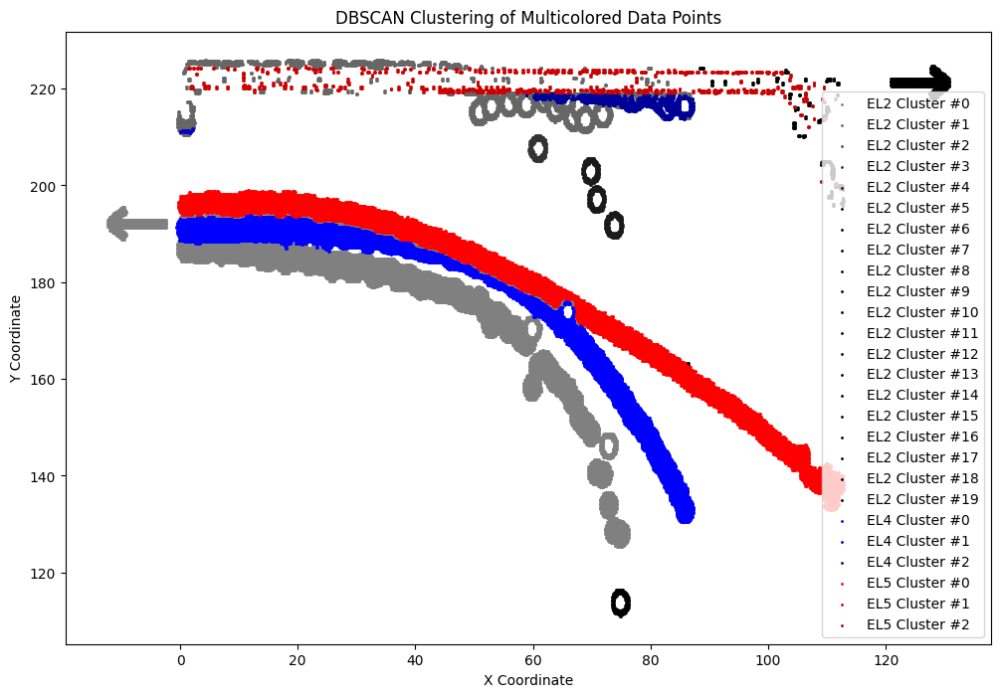

{'topLeft': (169, 39), 'bottomRight': (1211, 560)}


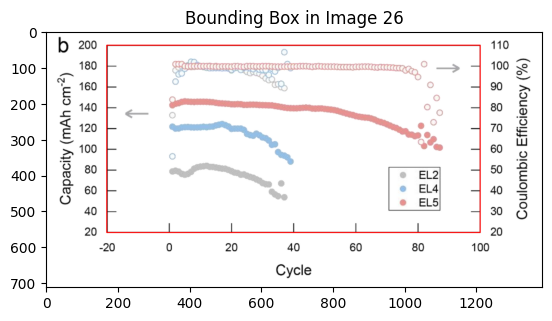

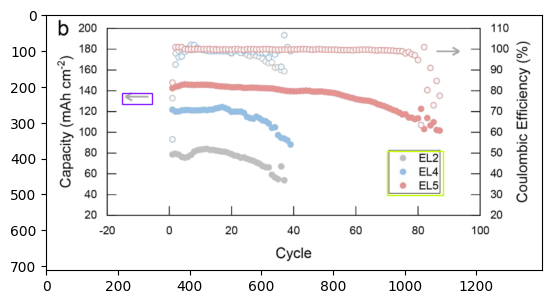

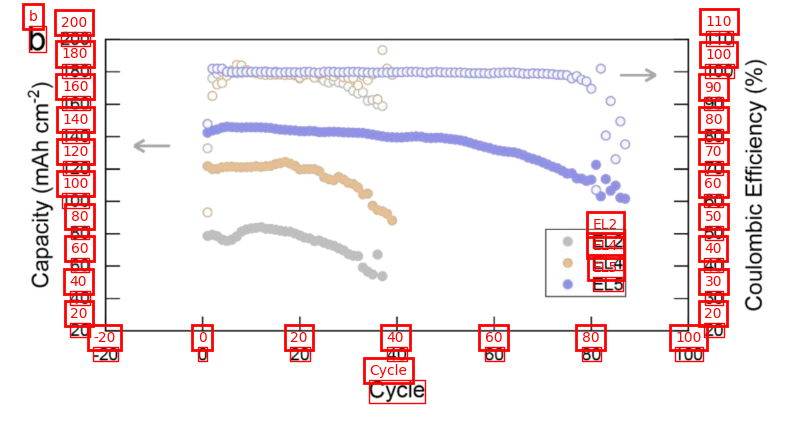

Y MIN 20
Y MAX 200
SEMANTIC Y MIN 20.0
SEMANTIC Y MAX 200.0
Y
OCR DIFF -519.6121896505356
SEM DIFF 180.0
OCR RATIO -2.88673438694742
PIXEL DIFF -2.3739048838615417
REAL DIFF FROM BASE POINT 0.8223496053517517
Y_MIN 19.17765039464825
Y_MAX 199.6584048262785
SEMANTIC X MIN -20.0
SEMANTIC X MAX 100.0
X
OCR DIFF 1041.8924627751112
SEM DIFF 120.0
OCR RATIO 0.11517503416847501
PIXEL DIFF 1.201727256178856
REAL DIFF FROM BASE POINT 0.13840897779158745
X_MIN -20.13840897779159
X_MAX 99.87397662575937
X
Predicted [-20.13840897779159, 99.87397662575937]
Chat GPT [-20, 100]
Y
Predicted [19.17765039464825, 199.6584048262785]
Chat GPT [20, 200]


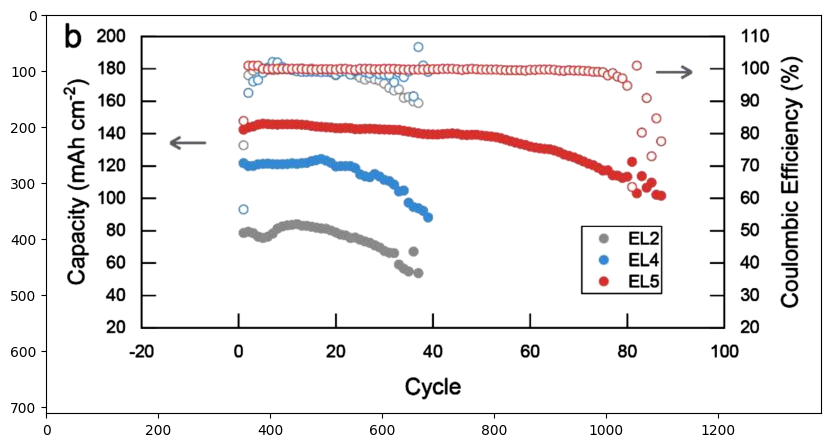

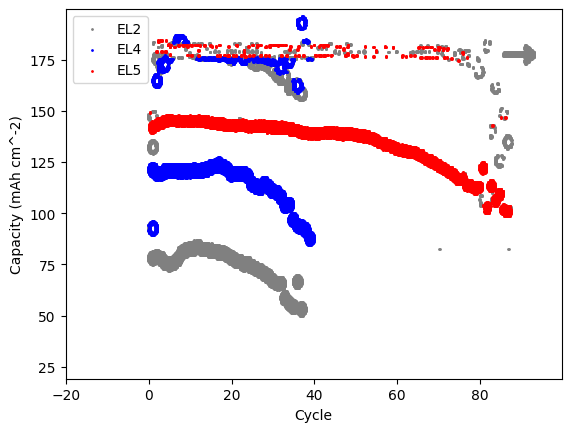

grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
(0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
(0.0, 0.0, 0.0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
blue
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
(0.0, 0.0, 0.3999999999999999)
(0.0, 0.0, 0.19999999999999996)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
red
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)
(0.6, 0.0, 0.0)
(0.3999999999999999, 0.0, 0.0)
(0.19999999999999996, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)


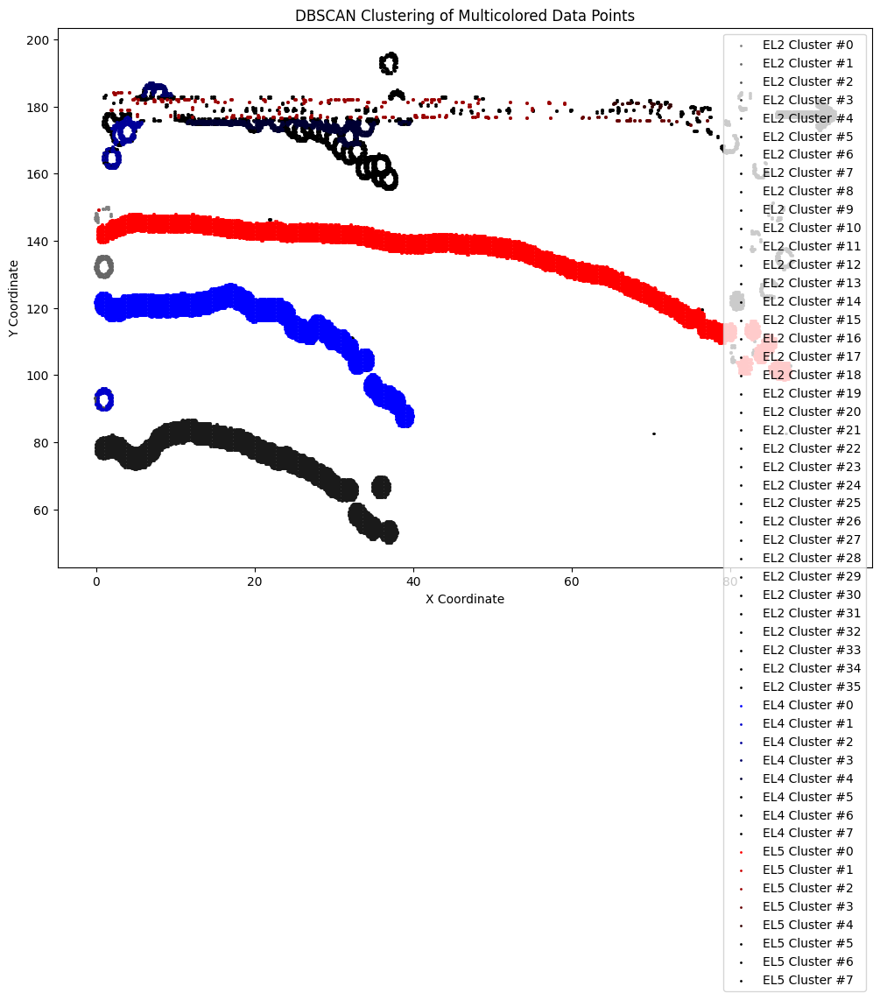

{'topLeft': (171, 39), 'bottomRight': (1215, 561)}


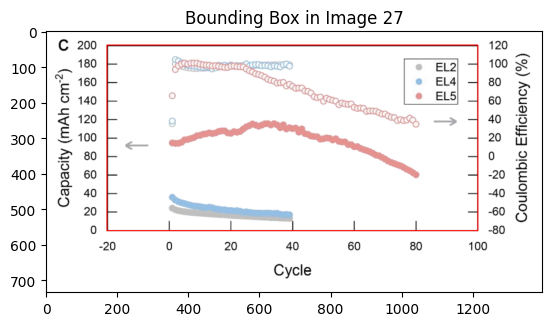

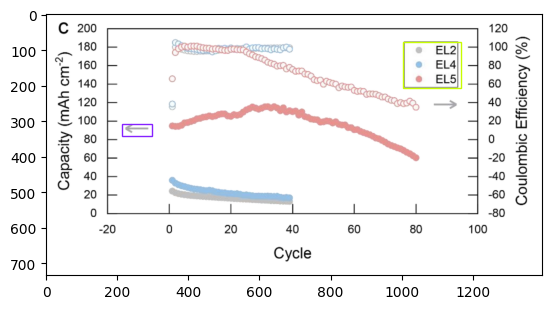

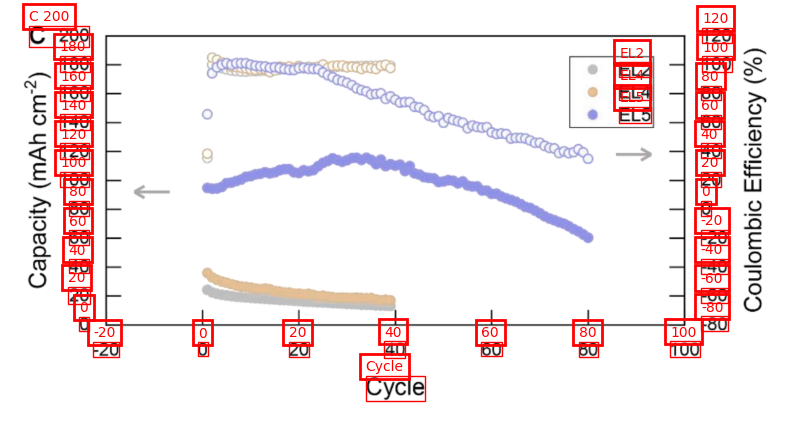

Y MIN 0
Y MAX 180
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 180.0
Y
OCR DIFF -467.96967074275017
SEM DIFF 180.0
OCR RATIO -2.59983150412639
PIXEL DIFF -2.440985720604658
REAL DIFF FROM BASE POINT 0.9389015083209755
Y_MIN -0.9389015083209755
Y_MAX 199.84334117605843
SEMANTIC X MIN -20.0
SEMANTIC X MAX 100.0
X
OCR DIFF 1042.8252710029483
SEM DIFF 120.0
OCR RATIO 0.11507200998743417
PIXEL DIFF 1.8106782734394073
REAL DIFF FROM BASE POINT 0.20835838836524953
X_MIN -20.208358388365248
X_MAX 99.92682003851601
X
Predicted [-20.208358388365248, 99.92682003851601]
Chat GPT [-20, 100]
Y
Predicted [-0.9389015083209755, 199.84334117605843]
Chat GPT [0, 200]


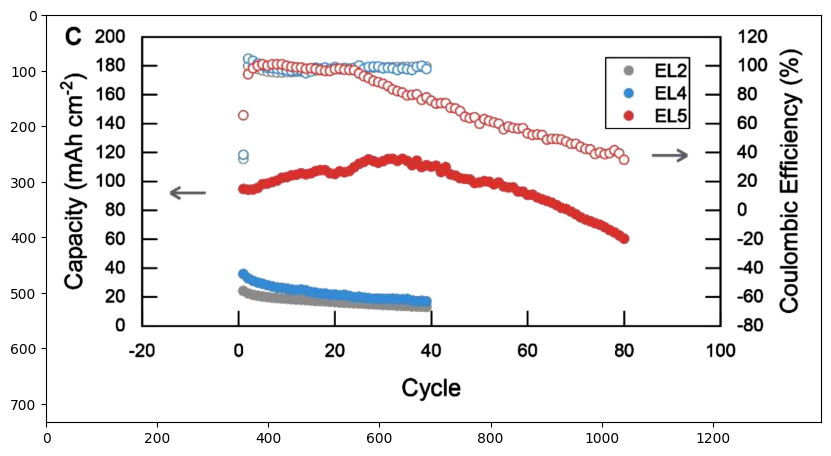

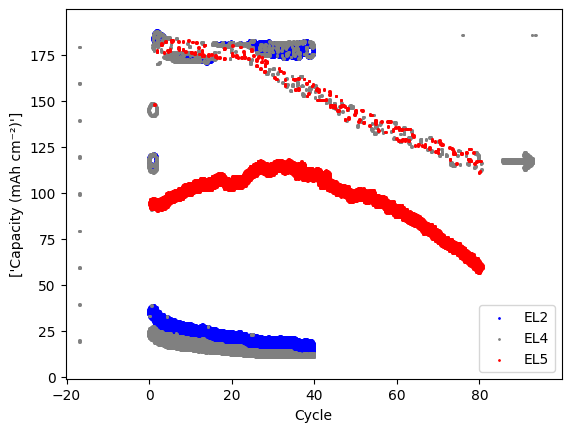

blue
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
(0.0, 0.0, 0.3999999999999999)
(0.0, 0.0, 0.19999999999999996)
grey
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
(0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
(0.0, 0.0, 0.0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
red
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)
(0.6, 0.0, 0.0)
(0.3999999999999999, 0.0, 0.0)
(0.19999999999999996, 0.0, 0.0)
(0.0, 0.0, 0.0)


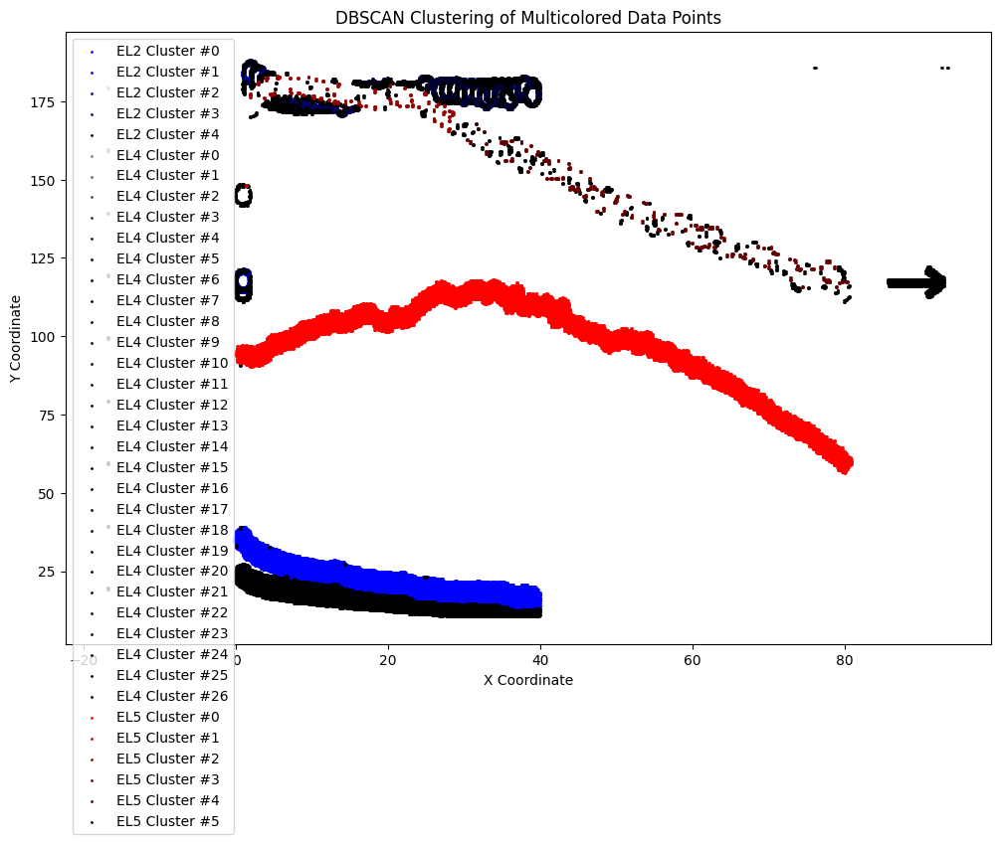

{'topLeft': (133, 30), 'bottomRight': (1388, 523)}


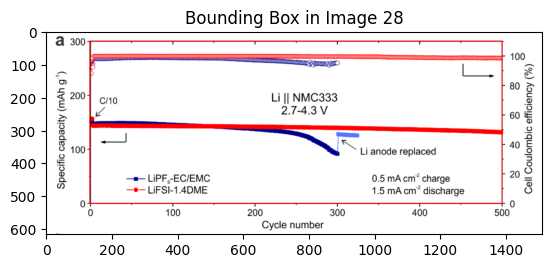

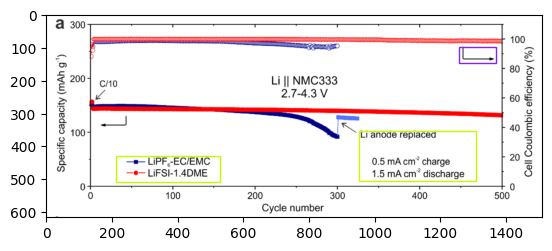

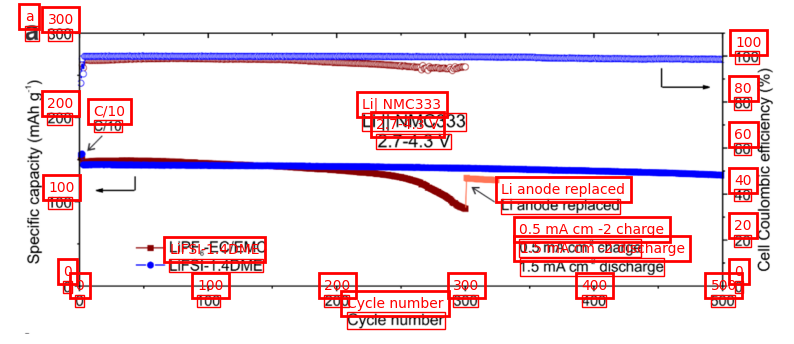

Y MIN 0
Y MAX 300
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 300.0
Y
OCR DIFF -491.64411003887653
SEM DIFF 300.0
OCR RATIO -1.6388137001295884
PIXEL DIFF 0.9052019119262695
REAL DIFF FROM BASE POINT -0.552351931067388
Y_MIN 0.552351931067388
Y_MAX 301.3797125767688
SEMANTIC X MIN 0.0
SEMANTIC X MAX 500.0
X
OCR DIFF 1253.0580368544906
SEM DIFF 500.0
OCR RATIO 0.39902381637097445
PIXEL DIFF 2.0019089225679636
REAL DIFF FROM BASE POINT 0.7988093383101744
X_MIN -0.7988093383101744
X_MAX 499.9760802072628
X
Predicted [-0.7988093383101744, 499.9760802072628]
Chat GPT [0, 500]
Y
Predicted [0.552351931067388, 301.3797125767688]
Chat GPT [0, 300]


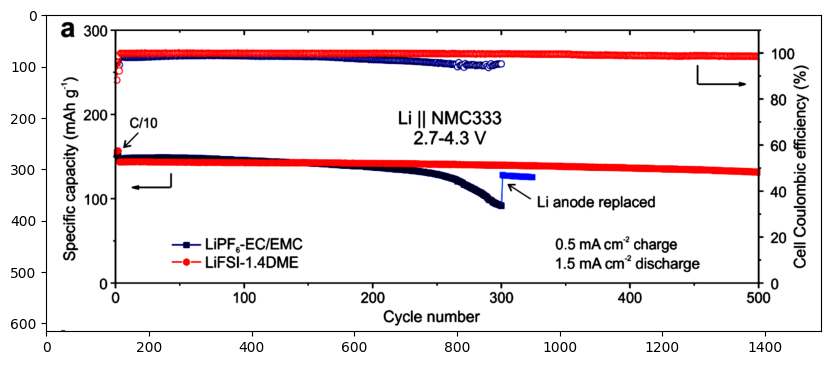

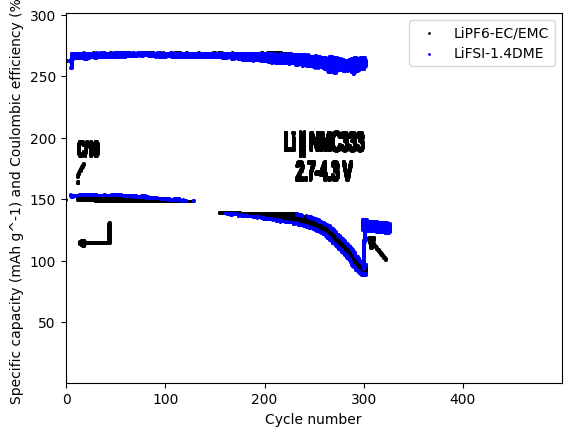

black
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
blue
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
(0.0, 0.0, 0.3999999999999999)
(0.0, 0.0, 0.19999999999999996)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)


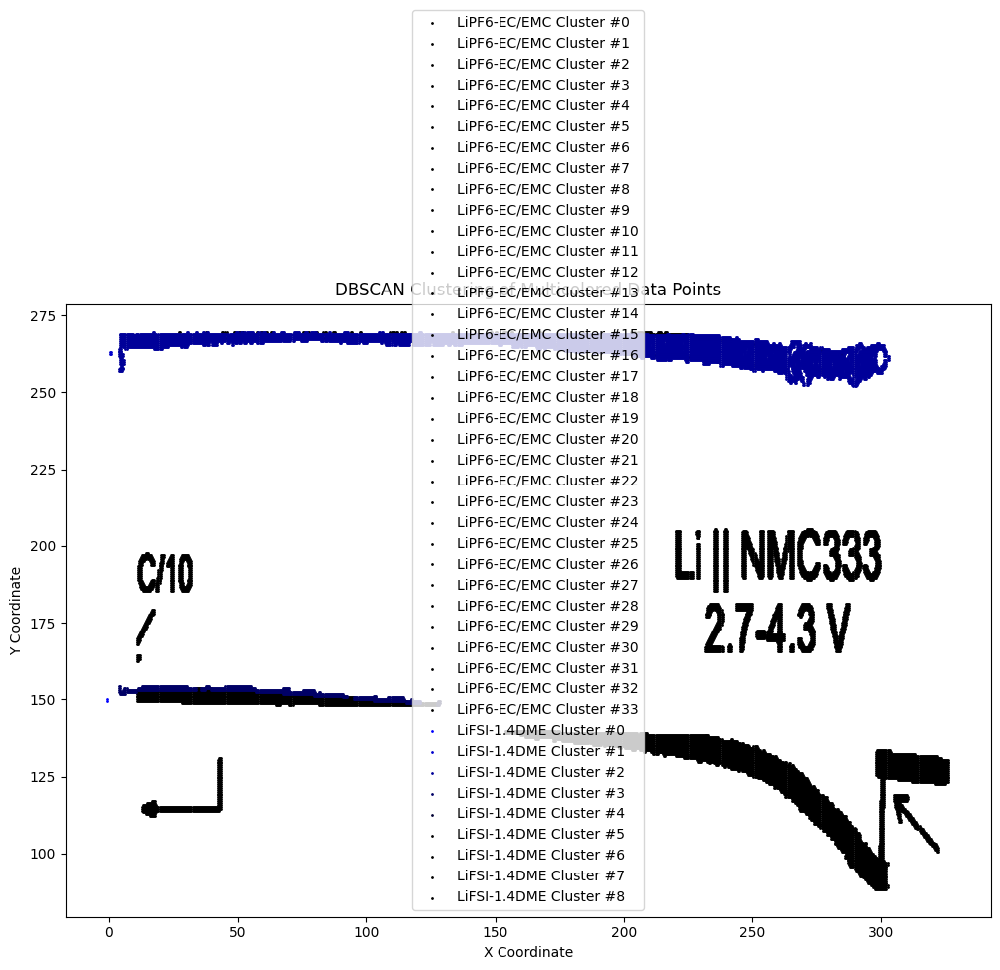

In [17]:
for image_num in range(1, 29):
    coordinates, x_axis_title, y_axis_title, axis_labels, rgb_colors, x_range, y_range, memo = get_reconstructed_plot(image_num, predictor, model, True, 30)
    
    plt.figure()
    for index, value in enumerate(coordinates):
        x = []
        y = []

        for i in range(len(value)):
            x.append(value[i]["middle"][0])
            y.append(value[i]["middle"][1])

        color_normalized = rgb_colors[index]

        if (is_valid_color(color_normalized)): plt.scatter(x, y, label=axis_labels[index], color=color_normalized, s=1)

    plt.xlim(x_range[0], x_range[1])
    plt.ylim(y_range[0], y_range[1])
    plt.xlabel(x_axis_title)
    plt.ylabel(y_axis_title)
    plt.legend()
    plt.show()

    if second_axis[image_num]:
        try:
            second_axis_clustering(rgb_colors, coordinates, axis_labels, x_axis_title, y_axis_title)
        except:
            print("ERROR CLUSTERING IMAGE", image_num)